In [8]:
%load_ext autoreload
%autoreload 2
import os
import glob
import h5py
import numpy as np
from IPython.display import display
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
import wandb

from m3util.viz.style import set_style
from m3util.viz.layout import layout_fig

from dl_utils.utils.dataset import split_train_valid, viz_dataloader, hdf5_dataset
from dl_utils.utils.utils import list_to_dict, find_last_epoch_file, sort_tasks_by_size

from dl_utils.training.build_model import resnet50_, fpn_resnet50_classification, xcit_small
from dl_utils.training.train_functions import train_epochs
from dl_utils.analysis.confusion_matrix import confusion_matrix, plot_cm, show_multiple_cm
from dl_utils.analysis.case_analysis import prediction_vs_actual, most_confused_pairs, generate_prediction_example
from dl_utils.packed_functions import viz_4confusion_matrix

set_style("printing")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
printing set for seaborn


## ResNet 50

Confusion Matrix for 09052024-resnet50-dataset_v5_size-1k:
['../../../results/ResNet50/09052024-resnet50-dataset_v5_size-1k-atom_cross_validation_cm.npy', '../../../results/ResNet50/09052024-resnet50-dataset_v5_size-1k-imagenet_train_cm.npy', '../../../results/ResNet50/09052024-resnet50-dataset_v5_size-1k-noise_cross_validation_cm.npy', '../../../results/ResNet50/09052024-resnet50-dataset_v5_size-1k-imagenet_valid_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


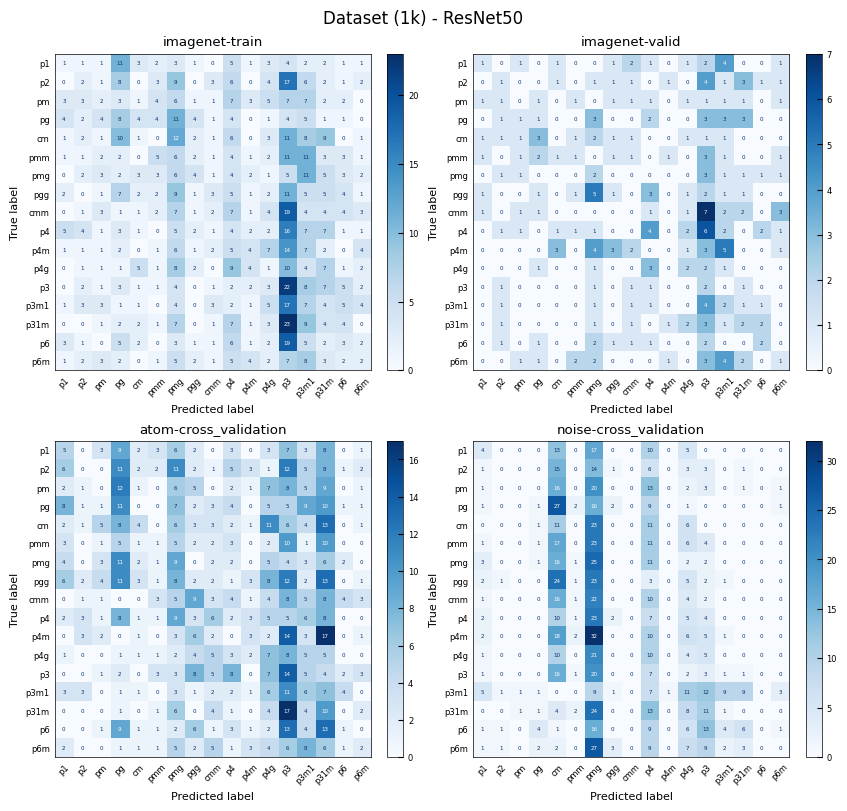

Confusion Matrix for 09022024-resnet50-dataset_v5_size-10k:
['../../../results/ResNet50/09022024-resnet50-dataset_v5_size-10k-atom_cross_validation_cm.npy', '../../../results/ResNet50/09022024-resnet50-dataset_v5_size-10k-imagenet_valid_cm.npy', '../../../results/ResNet50/09022024-resnet50-dataset_v5_size-10k-noise_cross_validation_cm.npy', '../../../results/ResNet50/09022024-resnet50-dataset_v5_size-10k-imagenet_train_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


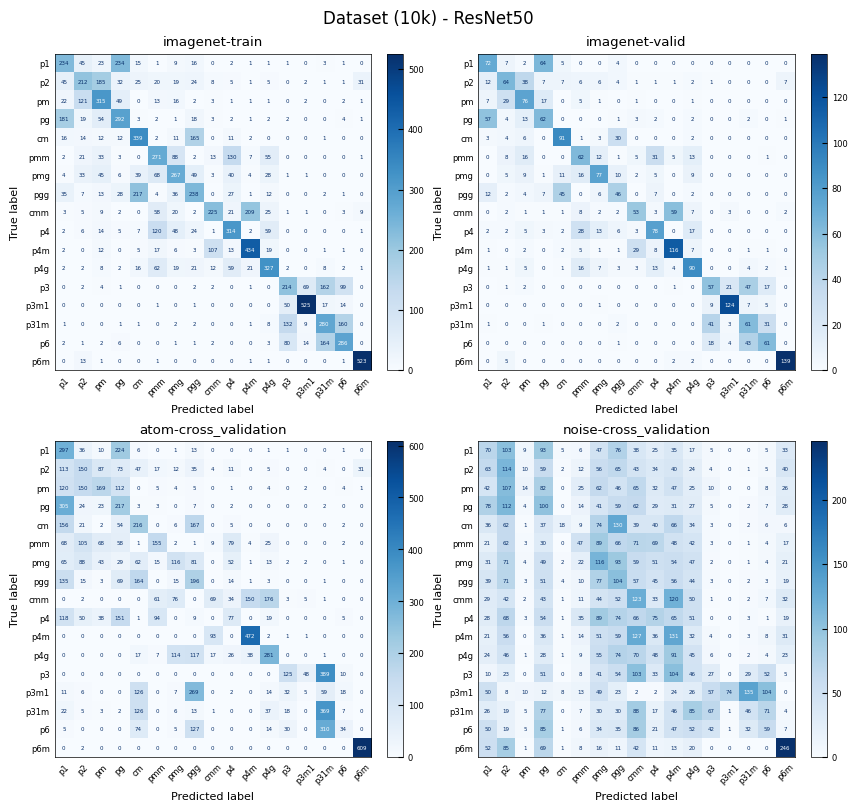

Confusion Matrix for 09082024-resnet50-dataset_v5_size-100k:
['../../../results/ResNet50/09082024-resnet50-dataset_v5_size-100k-imagenet_train_cm.npy', '../../../results/ResNet50/09082024-resnet50-dataset_v5_size-100k-atom_cross_validation_cm.npy', '../../../results/ResNet50/09082024-resnet50-dataset_v5_size-100k-imagenet_valid_cm.npy', '../../../results/ResNet50/09082024-resnet50-dataset_v5_size-100k-noise_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


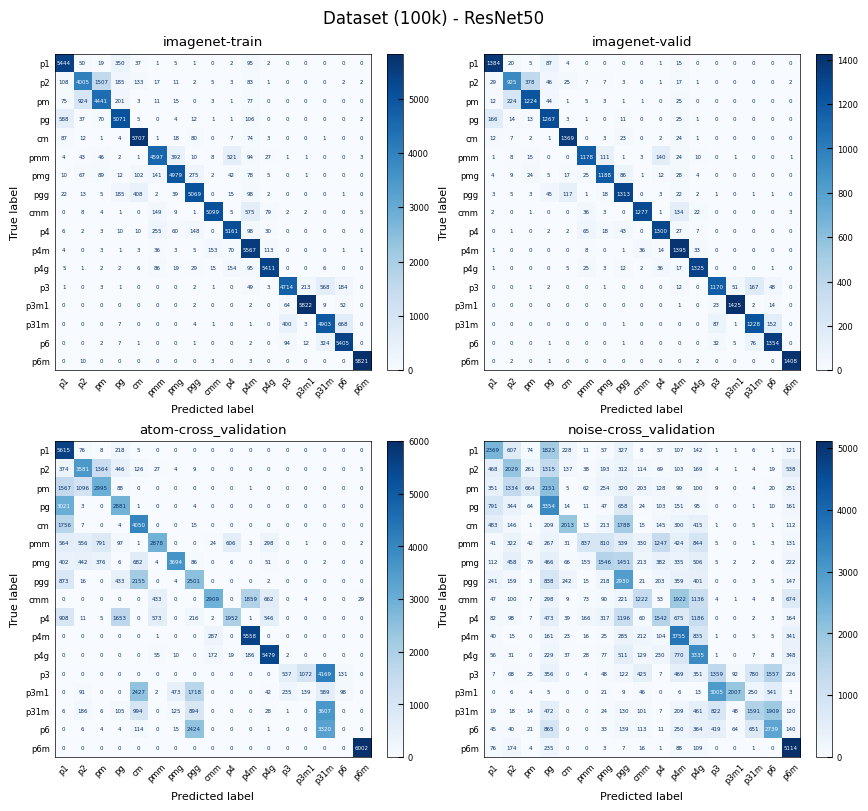

Confusion Matrix for 09022024-resnet50-dataset_v5_size-500k:
['../../../results/ResNet50/09022024-resnet50-dataset_v5_size-500k-noise_cross_validation_cm.npy', '../../../results/ResNet50/09022024-resnet50-dataset_v5_size-500k-atom_cross_validation_cm.npy', '../../../results/ResNet50/09022024-resnet50-dataset_v5_size-500k-imagenet_valid_cm.npy', '../../../results/ResNet50/09022024-resnet50-dataset_v5_size-500k-imagenet_train_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


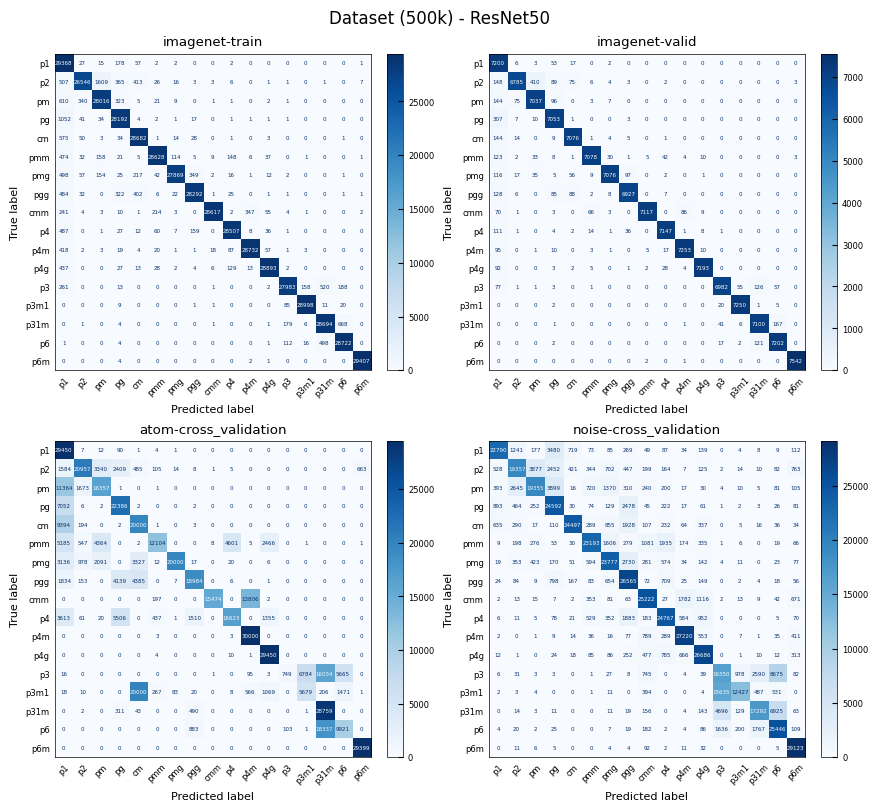

Confusion Matrix for 09022024-resnet50-dataset_v5_size-1m:
['../../../results/ResNet50/09022024-resnet50-dataset_v5_size-1m-atom_cross_validation_cm.npy', '../../../results/ResNet50/09022024-resnet50-dataset_v5_size-1m-noise_cross_validation_cm.npy', '../../../results/ResNet50/09022024-resnet50-dataset_v5_size-1m-imagenet_valid_cm.npy', '../../../results/ResNet50/09022024-resnet50-dataset_v5_size-1m-imagenet_train_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


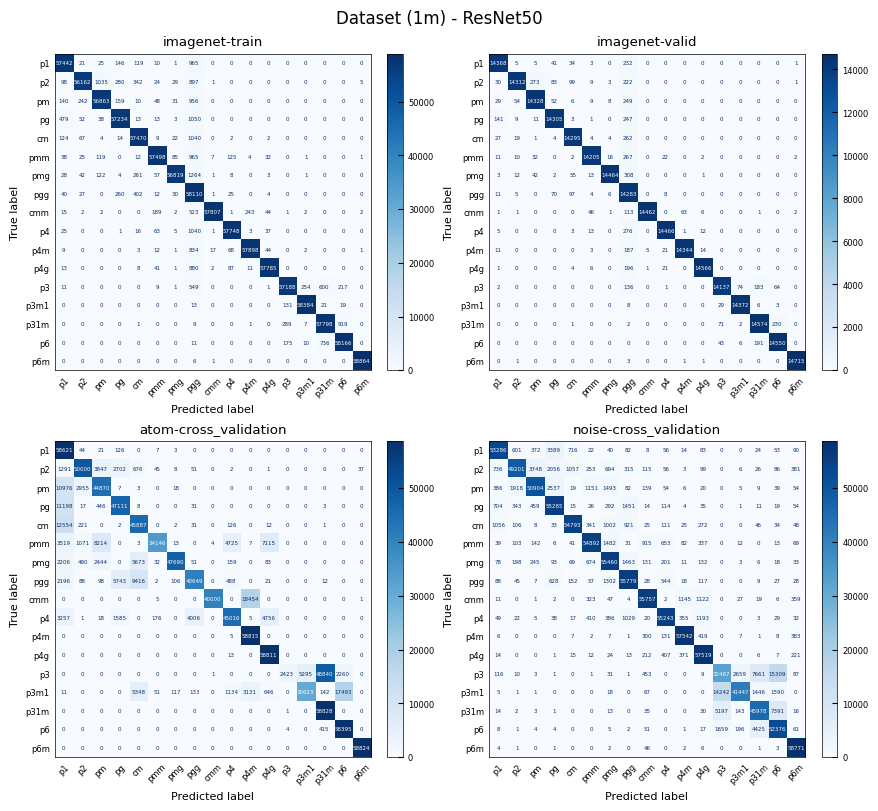

Confusion Matrix for 09052024-resnet50-dataset_v5_size-2m:
['../../../results/ResNet50/09052024-resnet50-dataset_v5_size-2m-noise_cross_validation_cm.npy', '../../../results/ResNet50/09052024-resnet50-dataset_v5_size-2m-atom_cross_validation_cm.npy', '../../../results/ResNet50/09052024-resnet50-dataset_v5_size-2m-imagenet_valid_cm.npy', '../../../results/ResNet50/09052024-resnet50-dataset_v5_size-2m-imagenet_train_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


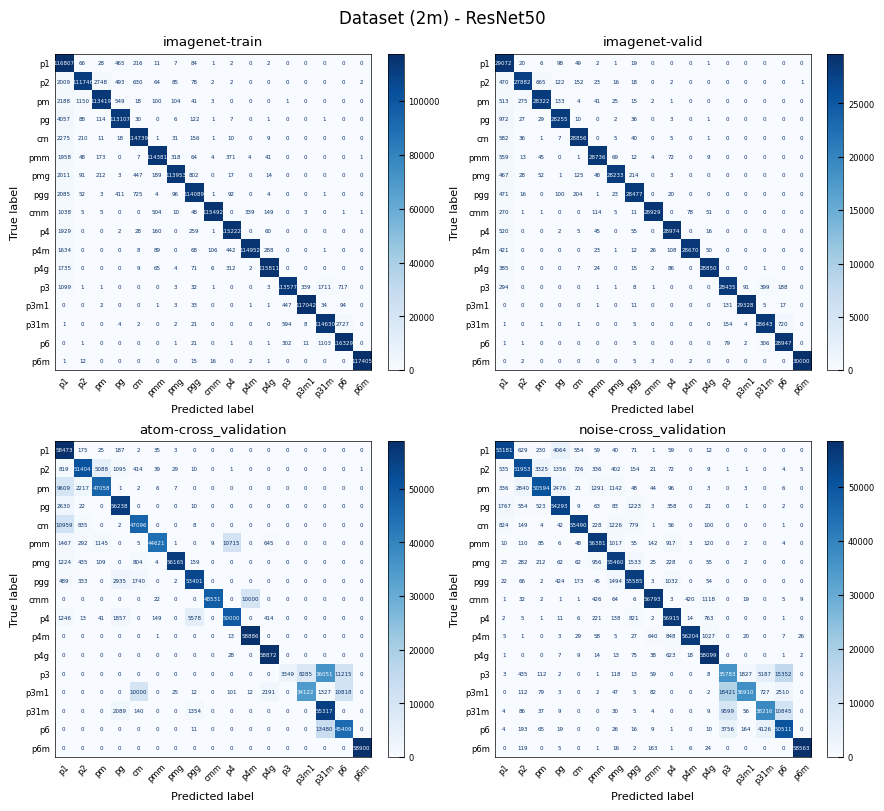

Confusion Matrix for 09032024-resnet50-dataset_v5_size-5m:
['../../../results/ResNet50/09032024-resnet50-dataset_v5_size-5m-imagenet_train_cm.npy', '../../../results/ResNet50/09032024-resnet50-dataset_v5_size-5m-imagenet_valid_cm.npy', '../../../results/ResNet50/09032024-resnet50-dataset_v5_size-5m-noise_cross_validation_cm.npy', '../../../results/ResNet50/09032024-resnet50-dataset_v5_size-5m-atom_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


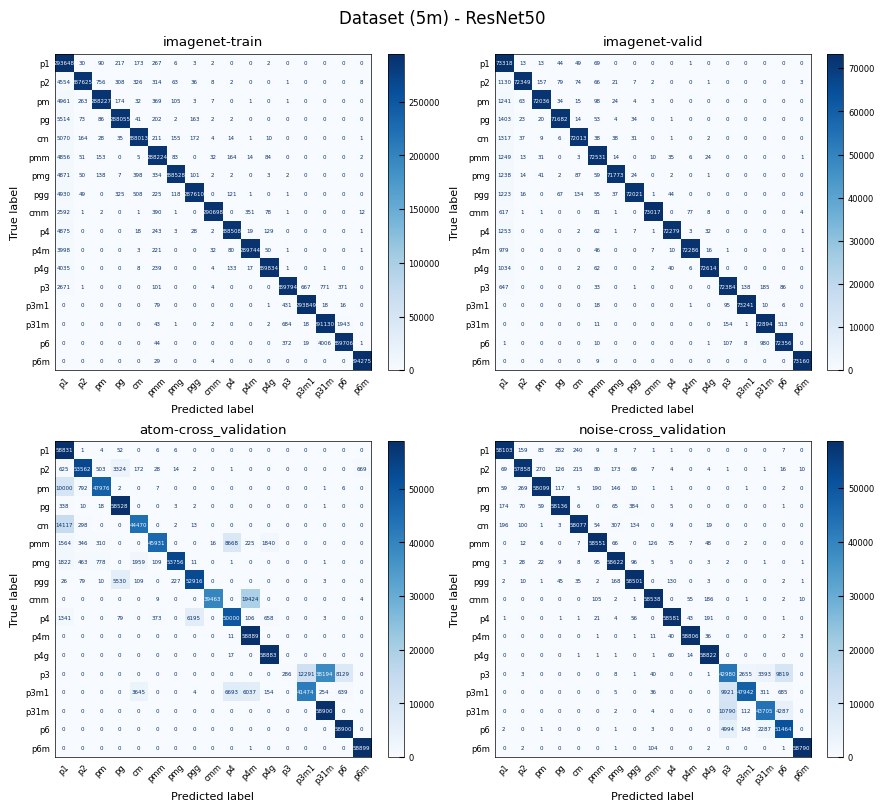

Confusion Matrix for 09112024-resnet50-dataset_v5_size-10m:
['../../../results/ResNet50/09112024-resnet50-dataset_v5_size-10m-atom_cross_validation_cm.npy', '../../../results/ResNet50/09112024-resnet50-dataset_v5_size-10m-imagenet_train_cm.npy', '../../../results/ResNet50/09112024-resnet50-dataset_v5_size-10m-noise_cross_validation_cm.npy', '../../../results/ResNet50/09112024-resnet50-dataset_v5_size-10m-imagenet_valid_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


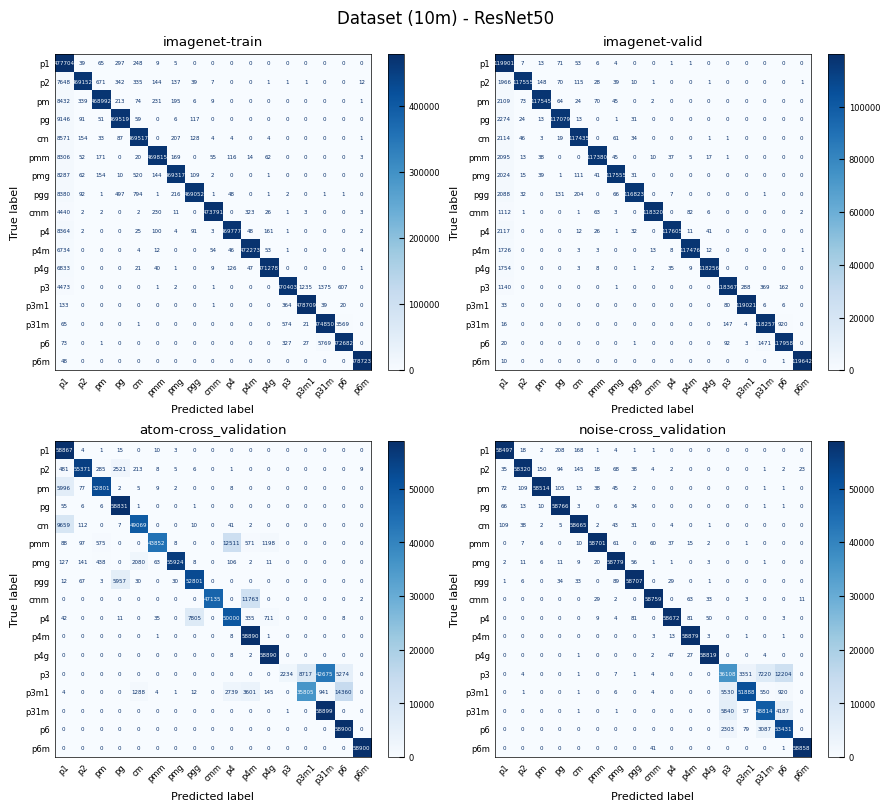

In [2]:
symmetry_classes = ['p1', 'p2', 'pm', 'pg', 'cm', 'pmm', 'pmg', 'pgg', 'cmm', 'p4', 'p4m', 'p4g', 'p3', 'p3m1', 'p31m', 'p6', 'p6m']
task_orders = ['1k', '10k', '100k', '500k', '1m', '2m', '5m', '10m']
dir_path_list = sort_tasks_by_size(glob.glob('../../../models/ResNet50/*'), task_orders)

for dir_path, ds_num in zip(dir_path_list, task_orders):
    task = os.path.basename(dir_path)
    print(f'Confusion Matrix for {task}:')
    cm_files = glob.glob(f'../../../results/ResNet50/{task}*')
    print(cm_files)
    cm_list = viz_4confusion_matrix(cm_files=cm_files, title=f'Dataset ({ds_num}) - ResNet50', symmetry_classes=symmetry_classes, filename=f'../../../figures/ConfusionMatrix/Dataset {ds_num}-ResNet50-ConfusionMatrix')

## FPN-ResNet50

Confusion Matrix for 09232024-FPN-dataset_v5_size-1k:
['../../../results/FPN/09232024-FPN-dataset_v5_size-1k-imagenet_train_cm.npy', '../../../results/FPN/09232024-FPN-dataset_v5_size-1k-atom_cross_validation_cm.npy', '../../../results/FPN/09232024-FPN-dataset_v5_size-1k-noise_cross_validation_cm.npy', '../../../results/FPN/09232024-FPN-dataset_v5_size-1k-imagenet_valid_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


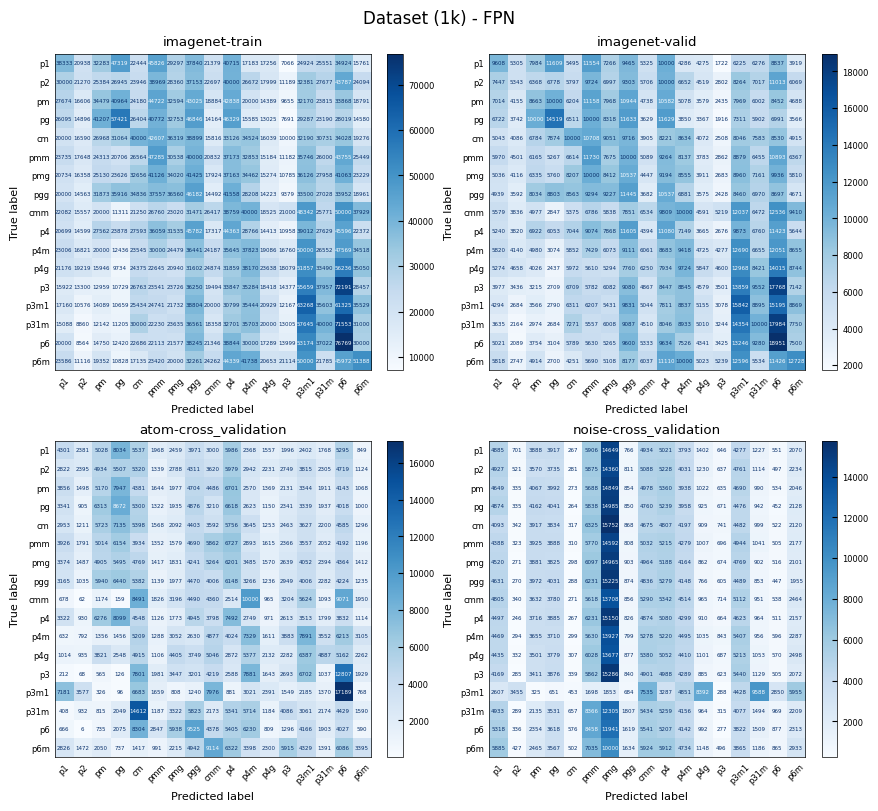

Confusion Matrix for 09232024-FPN-dataset_v5_size-10k:
['../../../results/FPN/09232024-FPN-dataset_v5_size-10k-imagenet_train_cm.npy', '../../../results/FPN/09232024-FPN-dataset_v5_size-10k-noise_cross_validation_cm.npy', '../../../results/FPN/09232024-FPN-dataset_v5_size-10k-imagenet_valid_cm.npy', '../../../results/FPN/09232024-FPN-dataset_v5_size-10k-atom_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


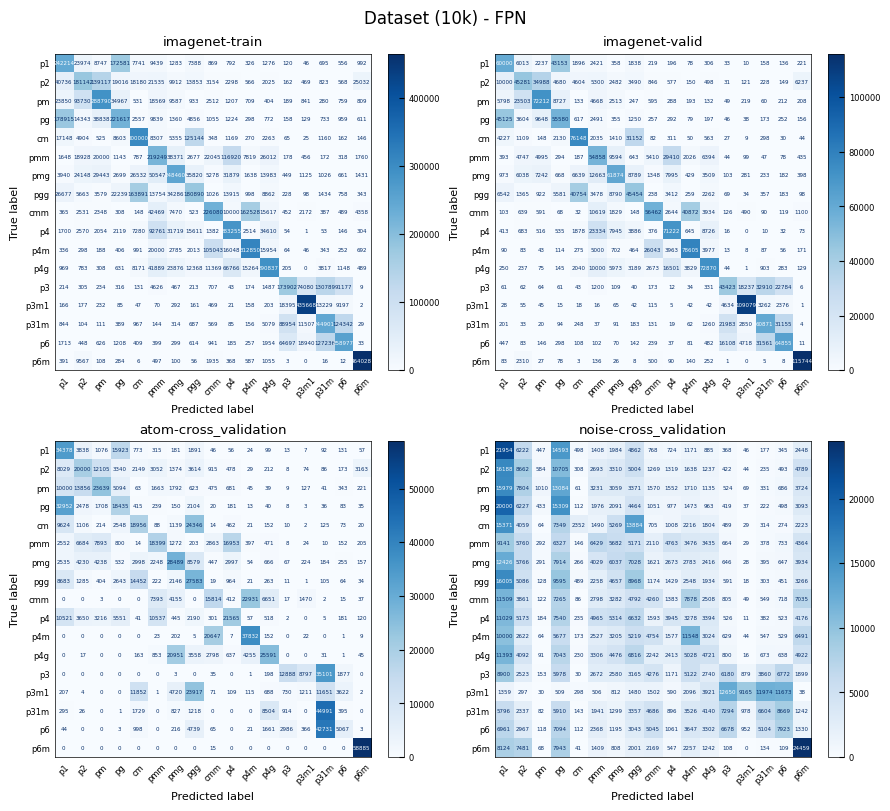

Confusion Matrix for 09242024-FPN-dataset_v5_size-100k:
['../../../results/FPN/09242024-FPN-dataset_v5_size-100k-noise_cross_validation_cm.npy', '../../../results/FPN/09242024-FPN-dataset_v5_size-100k-imagenet_valid_cm.npy', '../../../results/FPN/09242024-FPN-dataset_v5_size-100k-imagenet_train_cm.npy', '../../../results/FPN/09242024-FPN-dataset_v5_size-100k-atom_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


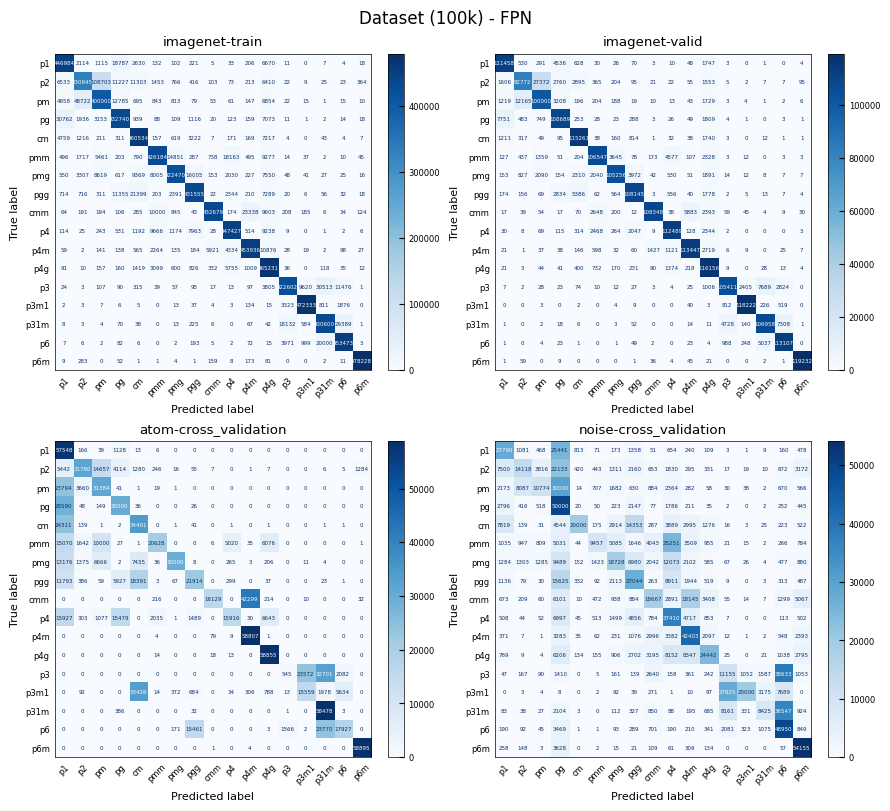

Confusion Matrix for 09252024-FPN-dataset_v5_size-500k:
['../../../results/FPN/09252024-FPN-dataset_v5_size-500k-atom_cross_validation_cm.npy', '../../../results/FPN/09252024-FPN-dataset_v5_size-500k-noise_cross_validation_cm.npy', '../../../results/FPN/09252024-FPN-dataset_v5_size-500k-imagenet_valid_cm.npy', '../../../results/FPN/09252024-FPN-dataset_v5_size-500k-imagenet_train_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


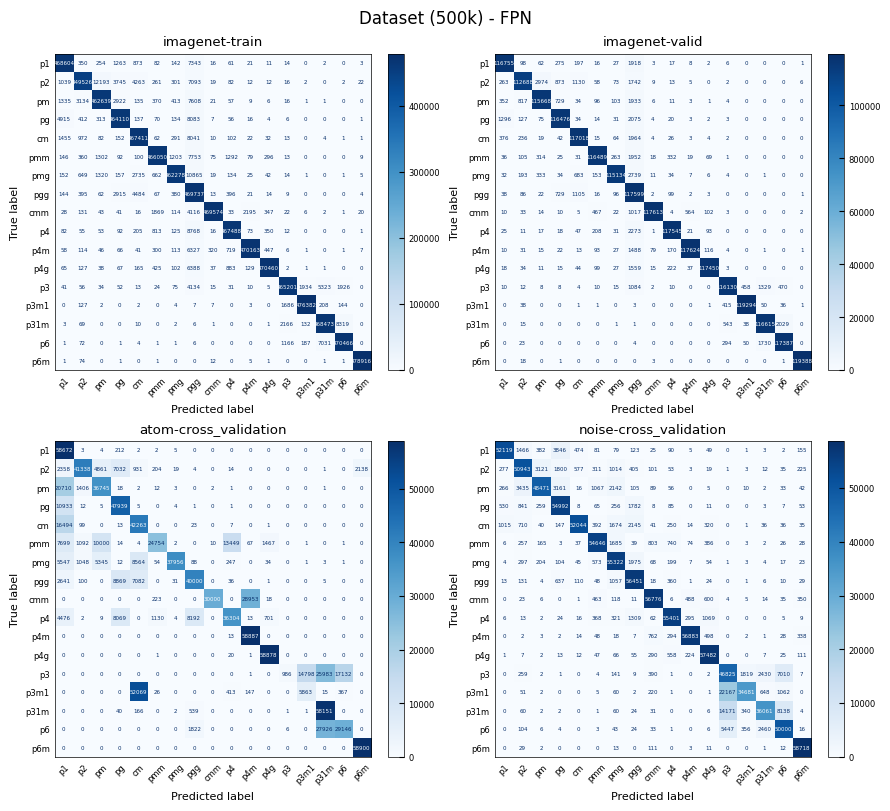

Confusion Matrix for 09252024-FPN-dataset_v5_size-1m:
['../../../results/FPN/09252024-FPN-dataset_v5_size-1m-imagenet_valid_cm.npy', '../../../results/FPN/09252024-FPN-dataset_v5_size-1m-imagenet_train_cm.npy', '../../../results/FPN/09252024-FPN-dataset_v5_size-1m-atom_cross_validation_cm.npy', '../../../results/FPN/09252024-FPN-dataset_v5_size-1m-noise_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


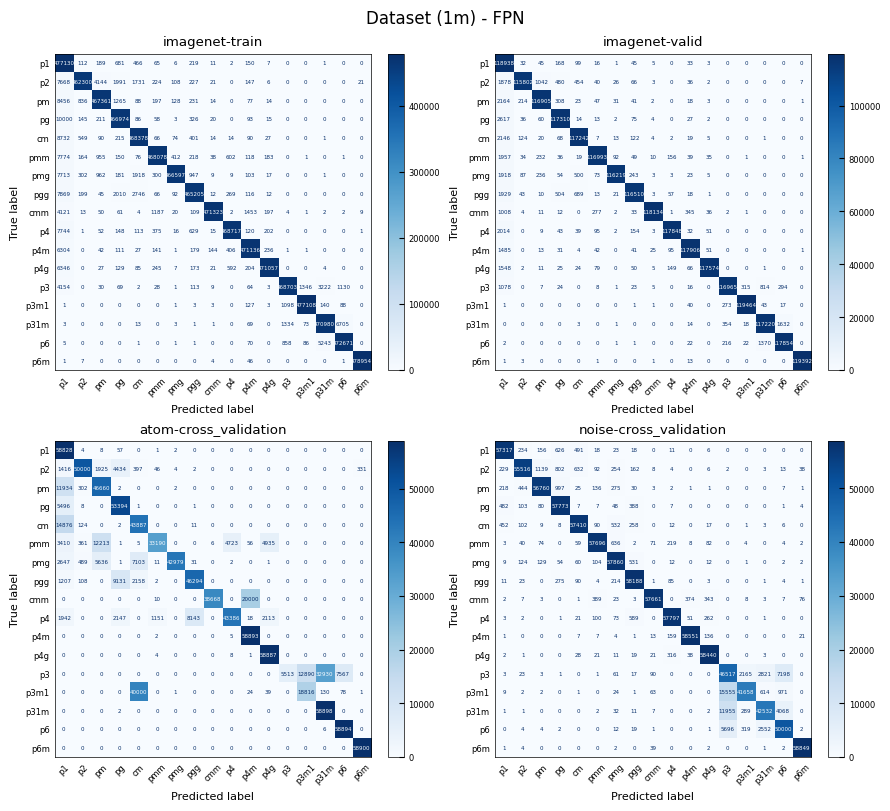

Confusion Matrix for 09262024-FPN-dataset_v5_size-2m:
['../../../results/FPN/09262024-FPN-dataset_v5_size-2m-imagenet_train_cm.npy', '../../../results/FPN/09262024-FPN-dataset_v5_size-2m-imagenet_valid_cm.npy', '../../../results/FPN/09262024-FPN-dataset_v5_size-2m-atom_cross_validation_cm.npy', '../../../results/FPN/09262024-FPN-dataset_v5_size-2m-noise_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


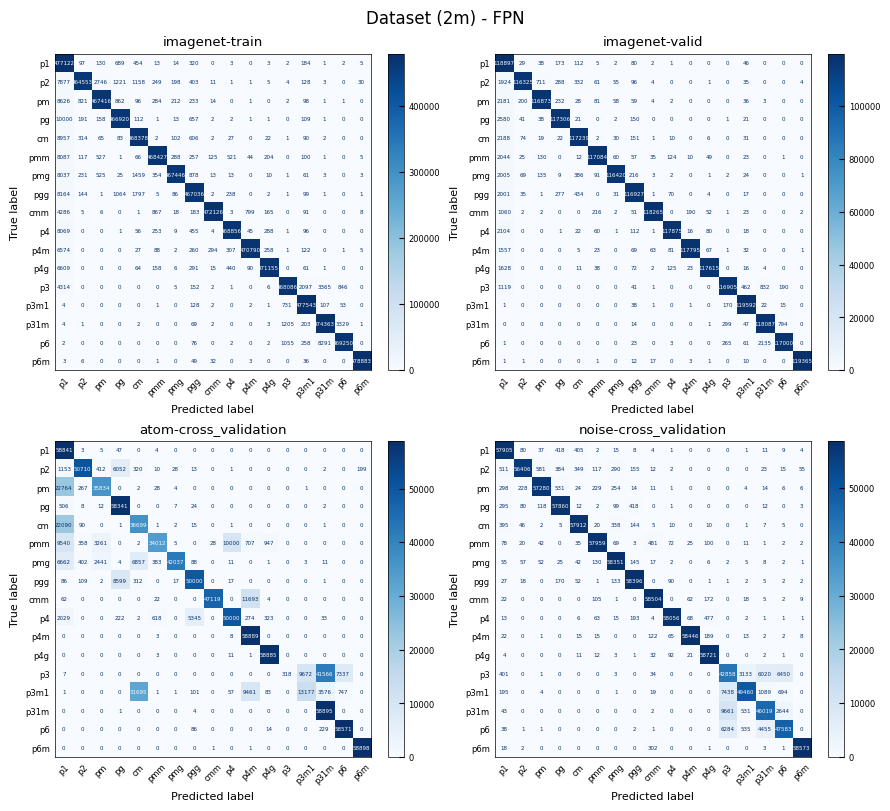

Confusion Matrix for 09272024-FPN-dataset_v5_size-5m:
['../../../results/FPN/09272024-FPN-dataset_v5_size-5m-imagenet_valid_cm.npy', '../../../results/FPN/09272024-FPN-dataset_v5_size-5m-atom_cross_validation_cm.npy', '../../../results/FPN/09272024-FPN-dataset_v5_size-5m-imagenet_train_cm.npy', '../../../results/FPN/09272024-FPN-dataset_v5_size-5m-noise_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


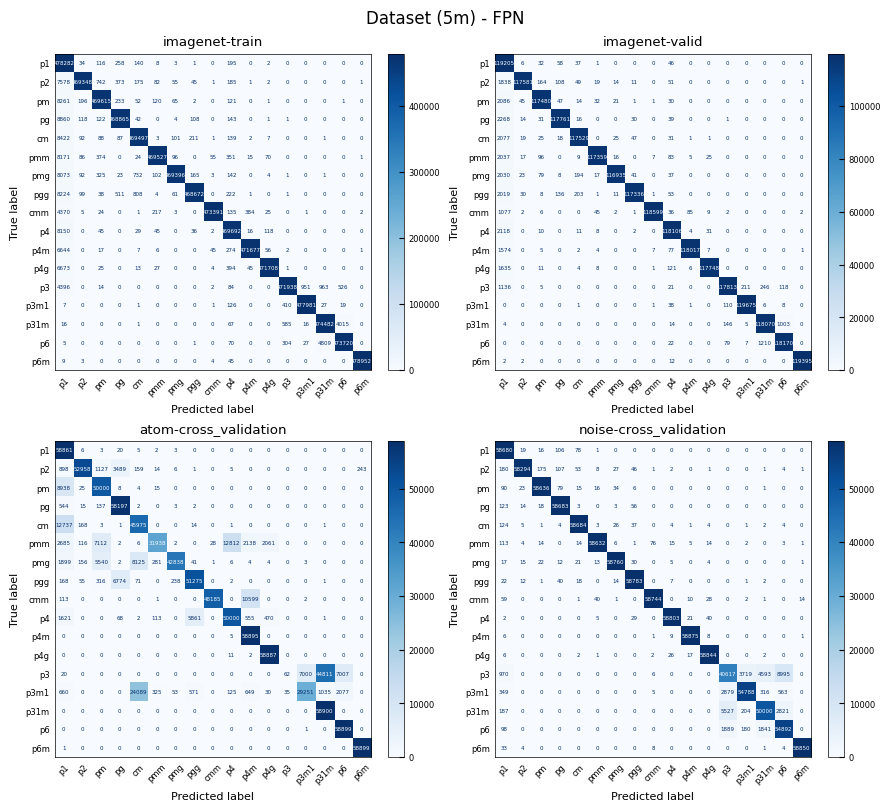

Confusion Matrix for 09282024-FPN-dataset_v5_size-10m:
['../../../results/FPN/09282024-FPN-dataset_v5_size-10m-imagenet_train_cm.npy', '../../../results/FPN/09282024-FPN-dataset_v5_size-10m-noise_cross_validation_cm.npy', '../../../results/FPN/09282024-FPN-dataset_v5_size-10m-imagenet_valid_cm.npy', '../../../results/FPN/09282024-FPN-dataset_v5_size-10m-atom_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


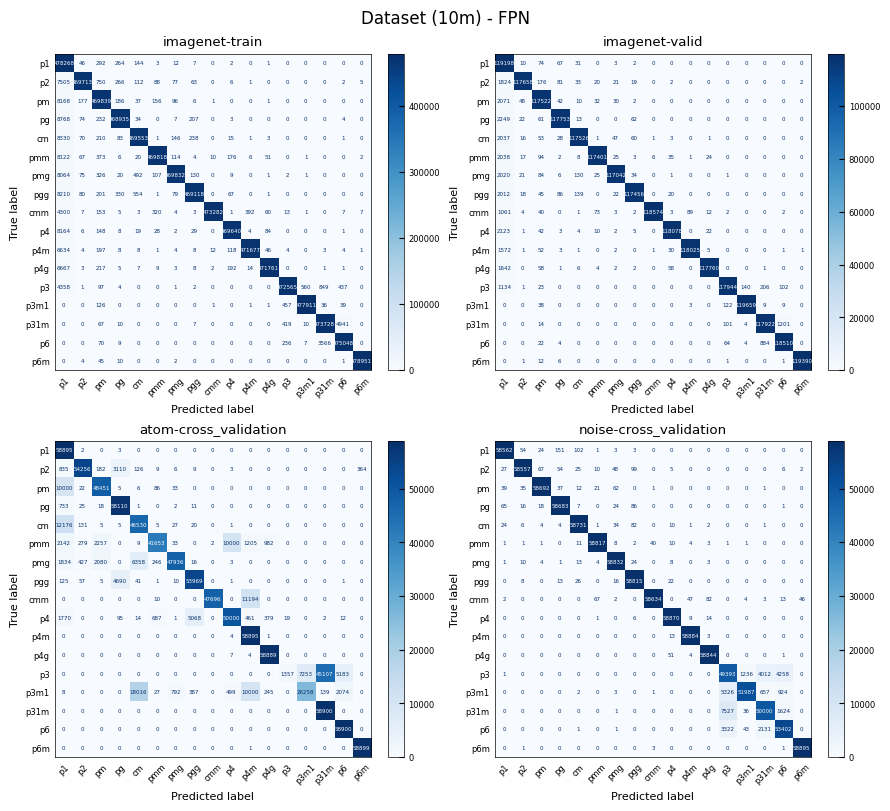

In [5]:
symmetry_classes = ['p1', 'p2', 'pm', 'pg', 'cm', 'pmm', 'pmg', 'pgg', 'cmm', 'p4', 'p4m', 'p4g', 'p3', 'p3m1', 'p31m', 'p6', 'p6m']
task_orders = ['1k', '10k', '100k', '500k', '1m', '2m', '5m', '10m']
dir_path_list = sort_tasks_by_size(glob.glob('../../../models/FPN/*'), task_orders)

for dir_path, ds_num in zip(dir_path_list, task_orders):
    task = os.path.basename(dir_path)
    print(f'Confusion Matrix for {task}:')
    cm_files = glob.glob(f'../../../results/FPN/{task}*')
    print(cm_files)
    cm_list = viz_4confusion_matrix(cm_files=cm_files, title=f'Dataset ({ds_num}) - FPN', symmetry_classes=symmetry_classes, filename=f'../../../figures/ConfusionMatrix/Dataset {ds_num}-FPN-ConfusionMatrix')

## XCiT 

Confusion Matrix for 09232024-XCiT-dataset_v5_size-1k:
['../../../results/XCiT/09232024-XCiT-dataset_v5_size-1k-imagenet_valid_cm.npy', '../../../results/XCiT/09232024-XCiT-dataset_v5_size-1k-imagenet_train_cm.npy', '../../../results/XCiT/09232024-XCiT-dataset_v5_size-1k-noise_cross_validation_cm.npy', '../../../results/XCiT/09232024-XCiT-dataset_v5_size-1k-atom_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


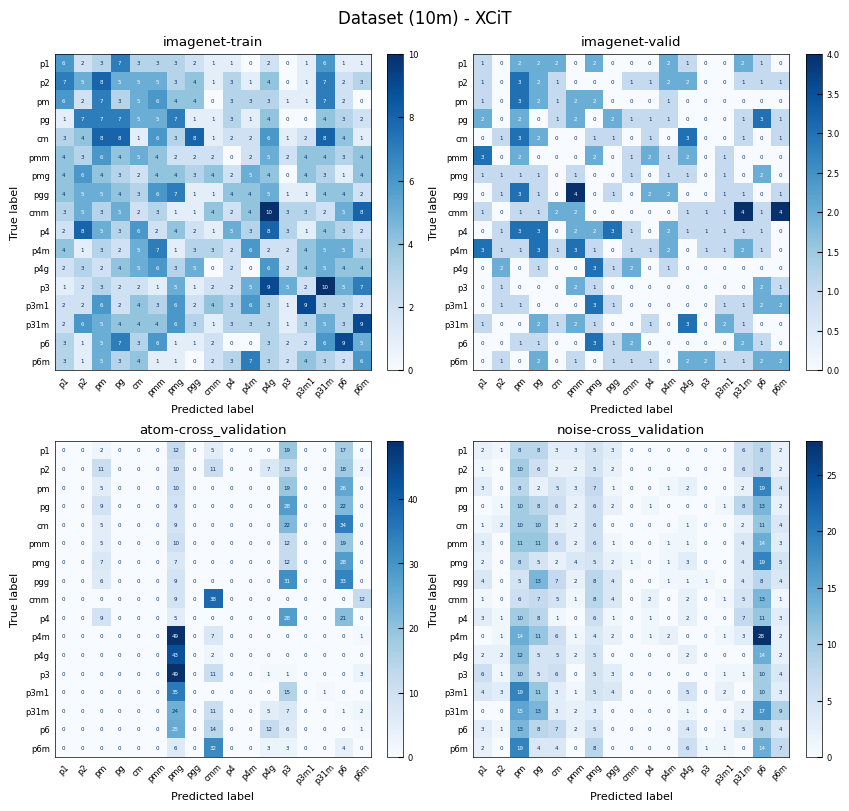

Confusion Matrix for 09232024-XCiT-dataset_v5_size-10k:
['../../../results/XCiT/09232024-XCiT-dataset_v5_size-10k-imagenet_train_cm.npy', '../../../results/XCiT/09232024-XCiT-dataset_v5_size-10k-noise_cross_validation_cm.npy', '../../../results/XCiT/09232024-XCiT-dataset_v5_size-10k-atom_cross_validation_cm.npy', '../../../results/XCiT/09232024-XCiT-dataset_v5_size-10k-imagenet_valid_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


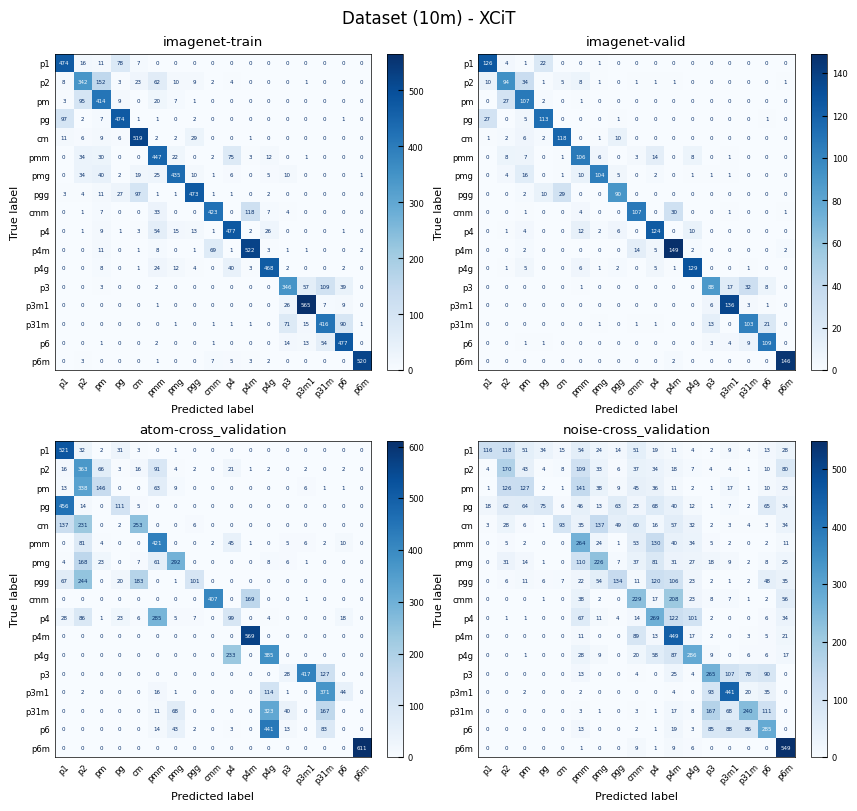

Confusion Matrix for 09302024-XCiT-dataset_v5_size-100k:
['../../../results/XCiT/09302024-XCiT-dataset_v5_size-100k-imagenet_valid_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-100k-atom_cross_validation_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-100k-imagenet_train_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-100k-noise_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


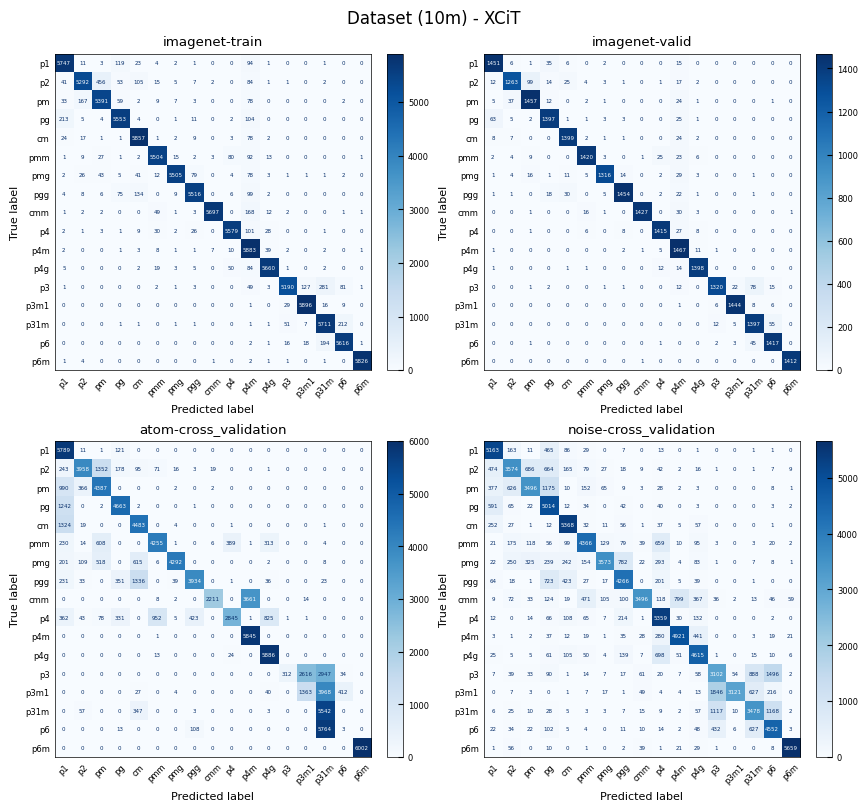

Confusion Matrix for 09302024-XCiT-dataset_v5_size-500k:
['../../../results/XCiT/09302024-XCiT-dataset_v5_size-500k-noise_cross_validation_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-500k-imagenet_valid_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-500k-atom_cross_validation_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-500k-imagenet_train_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


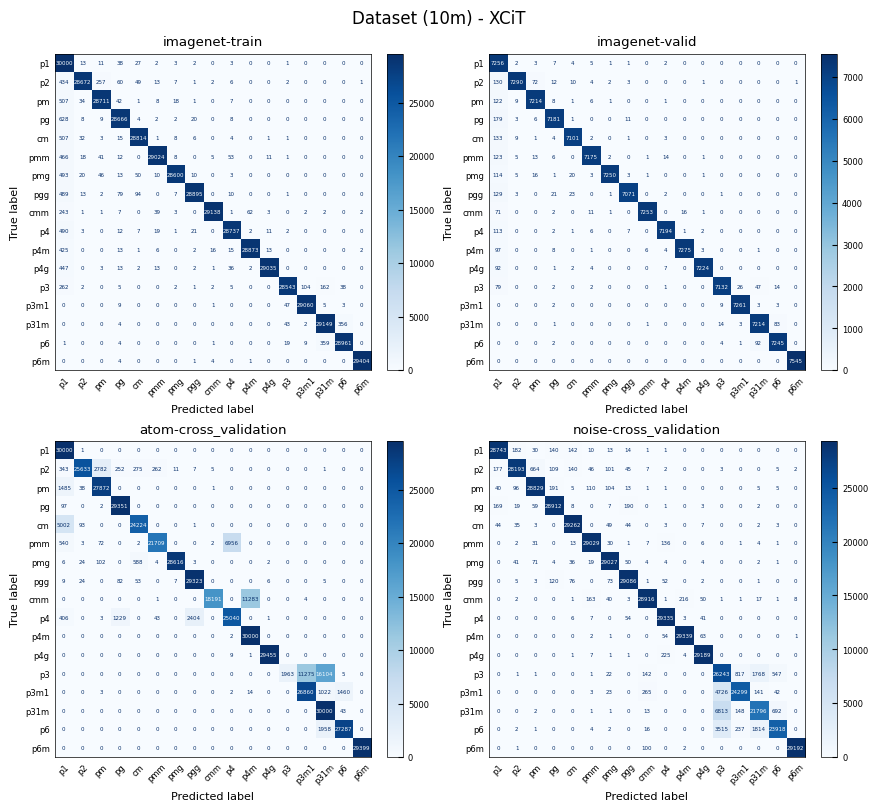

Confusion Matrix for 09302024-XCiT-dataset_v5_size-1m:
['../../../results/XCiT/09302024-XCiT-dataset_v5_size-1m-noise_cross_validation_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-1m-imagenet_train_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-1m-imagenet_valid_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-1m-atom_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


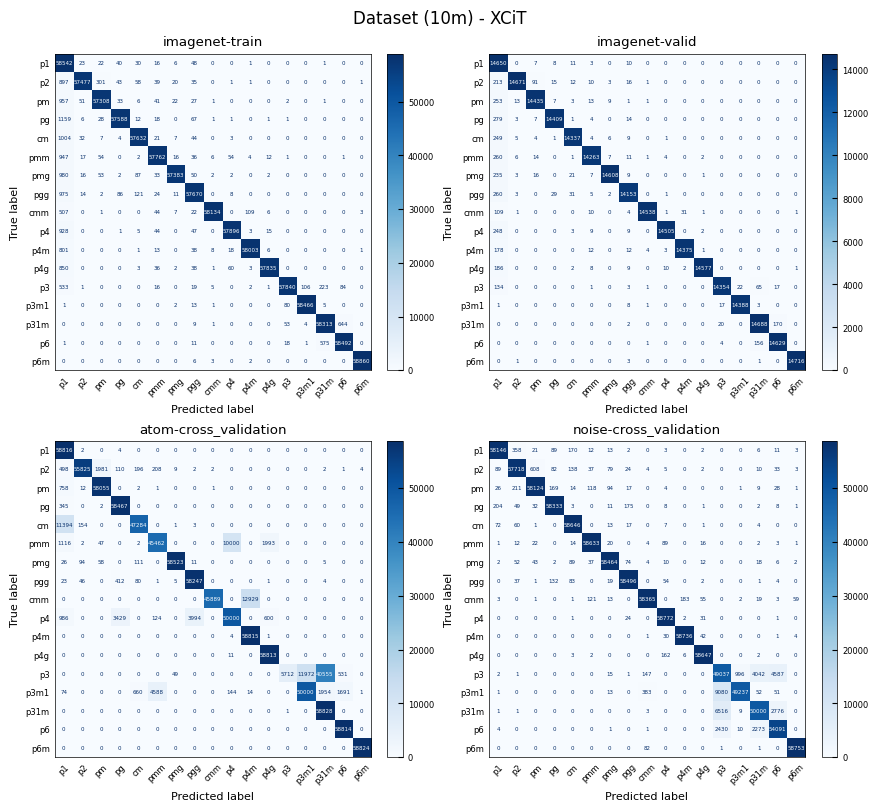

Confusion Matrix for 09302024-XCiT-dataset_v5_size-2m:
['../../../results/XCiT/09302024-XCiT-dataset_v5_size-2m-atom_cross_validation_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-2m-imagenet_valid_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-2m-imagenet_train_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-2m-noise_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


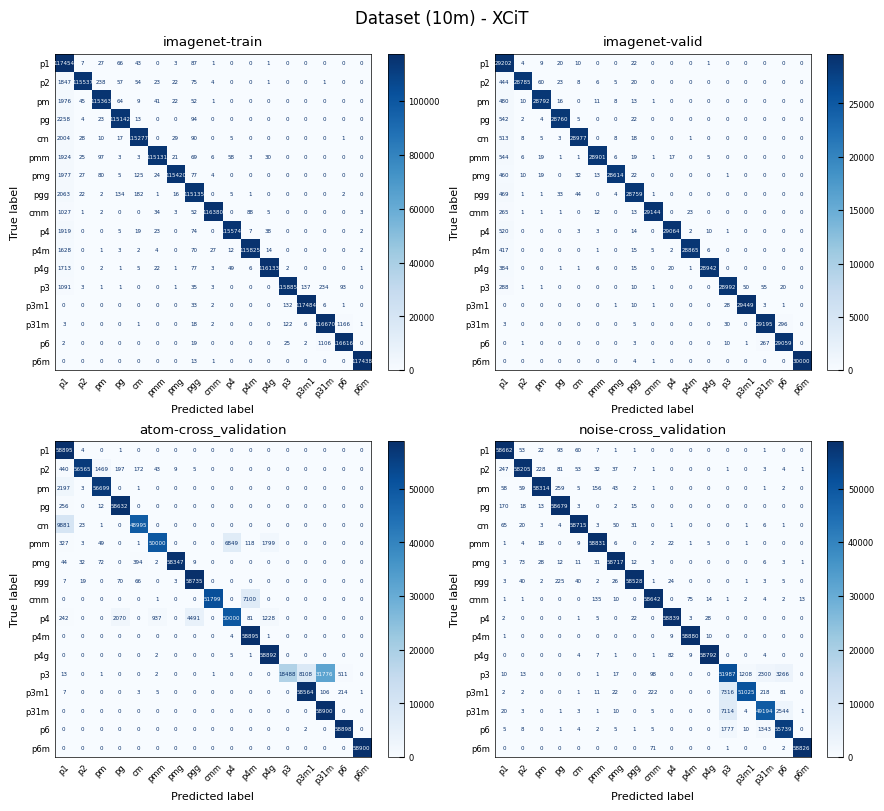

Confusion Matrix for 09302024-XCiT-dataset_v5_size-5m:
['../../../results/XCiT/09302024-XCiT-dataset_v5_size-5m-noise_cross_validation_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-5m-imagenet_valid_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-5m-imagenet_train_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-5m-atom_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


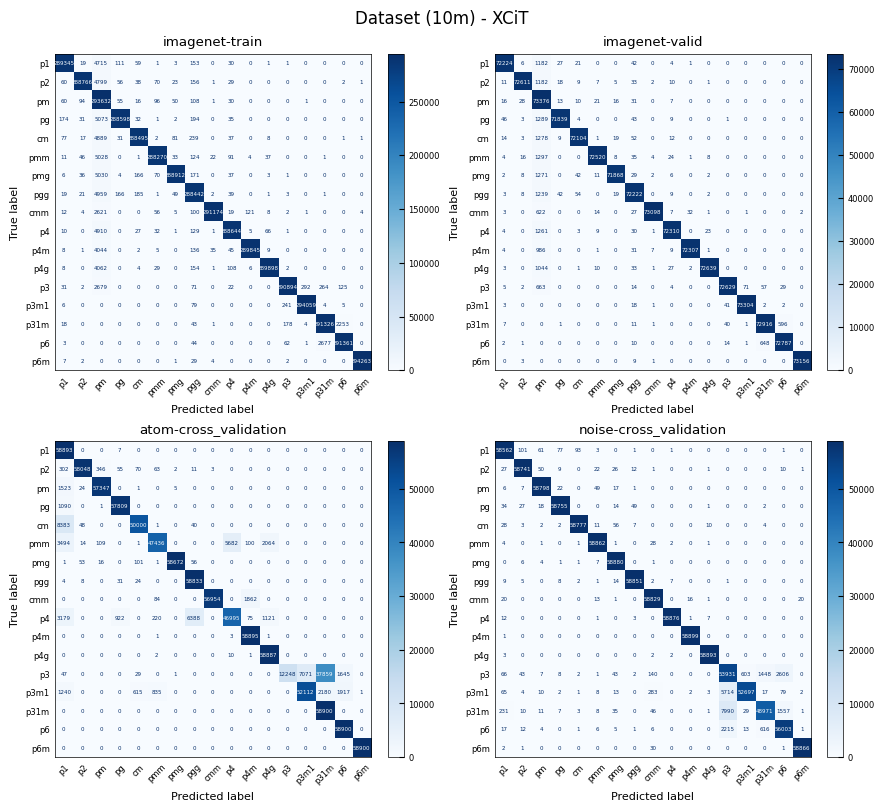

Confusion Matrix for 09302024-XCiT-dataset_v5_size-10m:
['../../../results/XCiT/09302024-XCiT-dataset_v5_size-10m-imagenet_train_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-10m-atom_cross_validation_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-10m-imagenet_valid_cm.npy', '../../../results/XCiT/09302024-XCiT-dataset_v5_size-10m-noise_cross_validation_cm.npy']


/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


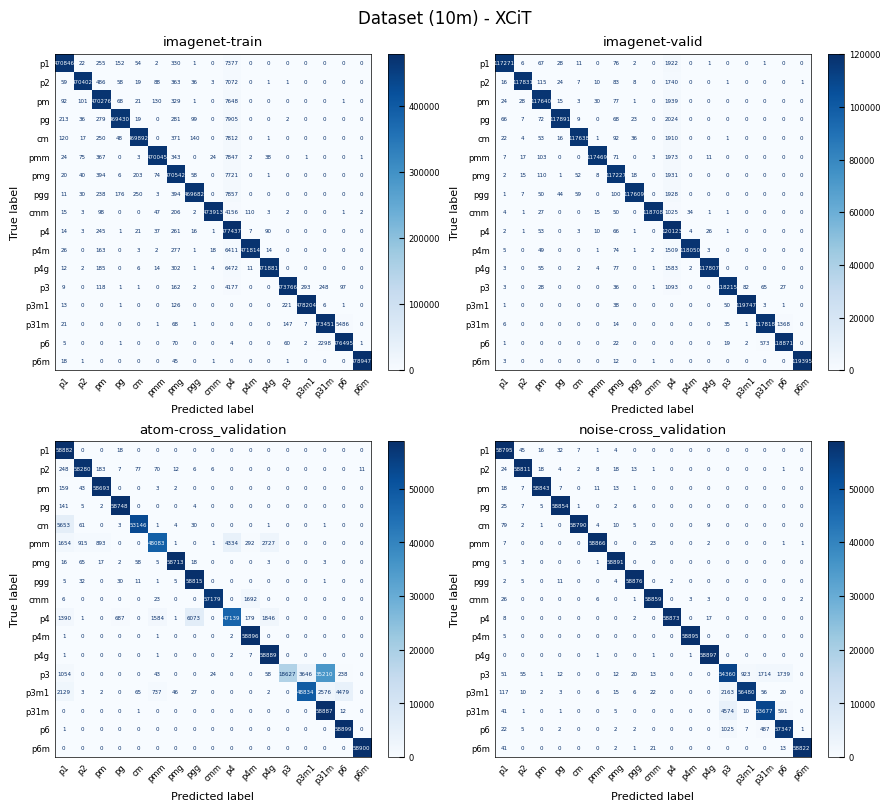

In [9]:
symmetry_classes = ['p1', 'p2', 'pm', 'pg', 'cm', 'pmm', 'pmg', 'pgg', 'cmm', 'p4', 'p4m', 'p4g', 'p3', 'p3m1', 'p31m', 'p6', 'p6m']
task_orders = ['1k', '10k', '100k', '500k', '1m', '2m', '5m', '10m']
dir_path_list = sort_tasks_by_size(glob.glob('../../../models/XCiT/*'), task_orders)

for dir_path, ds_num in zip(dir_path_list, task_orders):
    task = os.path.basename(dir_path)
    print(f'Confusion Matrix for {task}:')
    cm_files = glob.glob(f'../../../results/XCiT/{task}*')
    print(cm_files)
    cm_list = viz_4confusion_matrix(cm_files=cm_files, title=f'Dataset (10m) - XCiT', symmetry_classes=symmetry_classes, filename=f'../../../figures/ConfusionMatrix/Dataset {ds_num}-XCiT-ConfusionMatrix')

### draft

In [ ]:
# for dir_path, ds_num in zip(dir_path_list[:2], task_orders[:2]):
    
#     task = os.path.basename(dir_path)
    
#     print(f'Confusion Matrix for {task}:')
    
#     # cm = np.load(f'../../results/ResNet50/{task}-imagenet_train_cm.npy')
#     # plot_cm(cm, symmetry_classes, title=f'ResNet50-ImageNet-Valid ({ds_num})', cm_style='simple', font_size=4)

#     cm = np.load(f'../../results/ResNet50/{task}-imagenet_valid_cm.npy')
#     plot_cm(cm, symmetry_classes, title=f'ResNet50-ImageNet-Train ({ds_num})', cm_style='simple', font_size=4)
    
#     cm = np.load(f'../../results/ResNet50/{task}-atom_cross_validation_cm.npy')
#     plot_cm(cm, symmetry_classes, title=f'ResNet50-Atom-Cross_Validation ({ds_num})', cm_style='simple', font_size=4)

#     cm = np.load(f'../../results/ResNet50/{task}-noise_cross_validation_cm.npy')
#     plot_cm(cm, symmetry_classes, title=f'ResNet50-Noise-Cross_Validation ({ds_num})', cm_style='simple',  font_size=4)

Confusion Matrix for 09052024-resnet50-dataset_v5_size-1k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


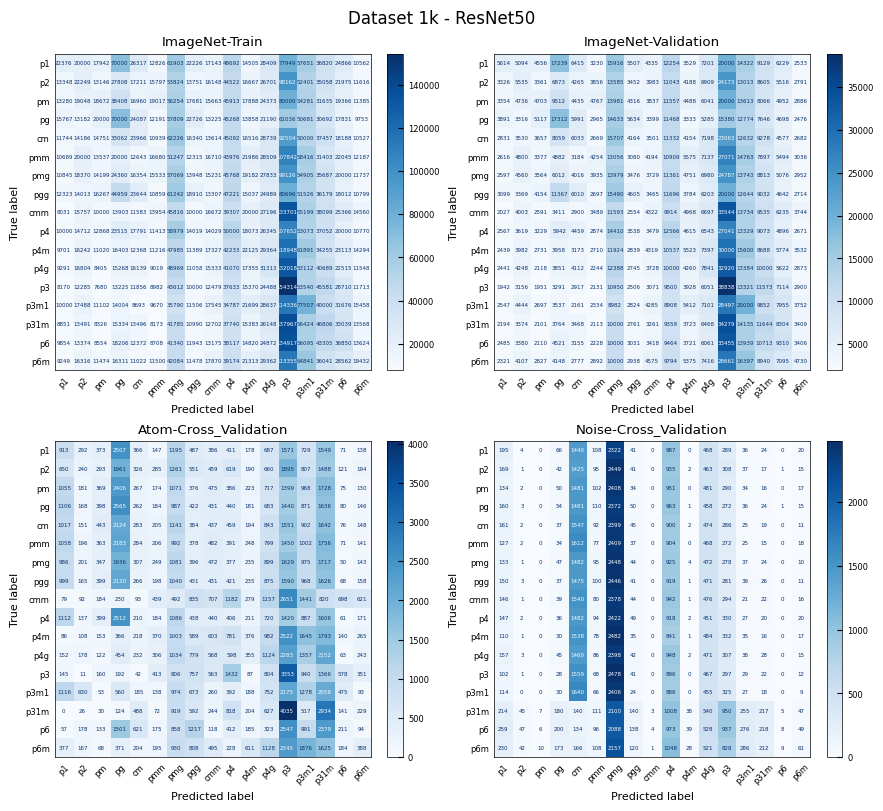

Confusion Matrix for 09022024-resnet50-dataset_v5_size-10k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


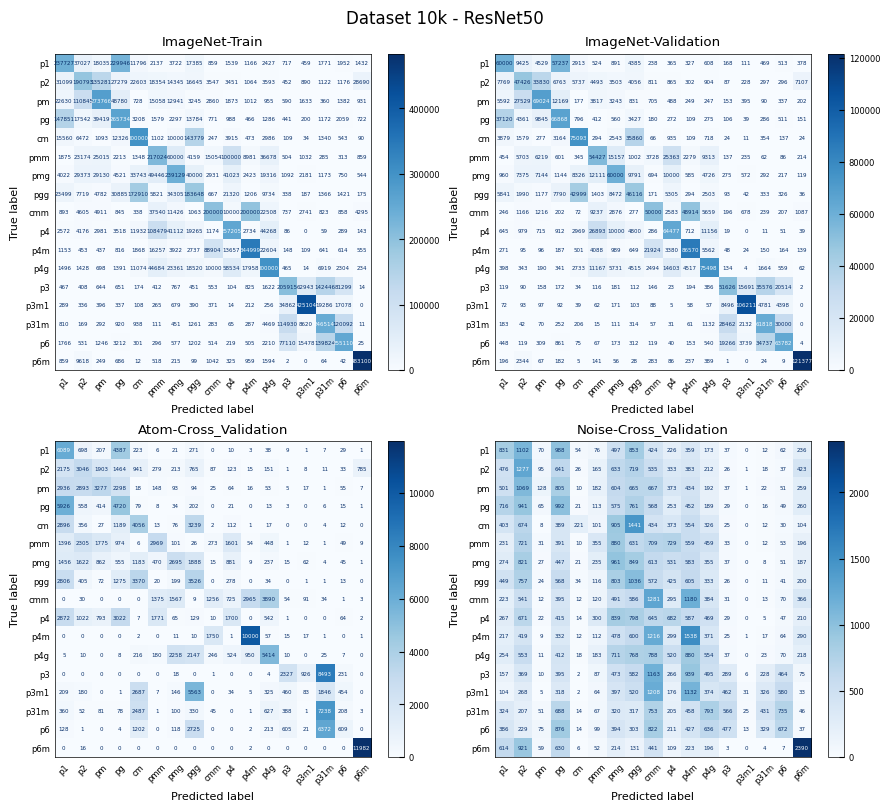

Confusion Matrix for 09082024-resnet50-dataset_v5_size-100k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


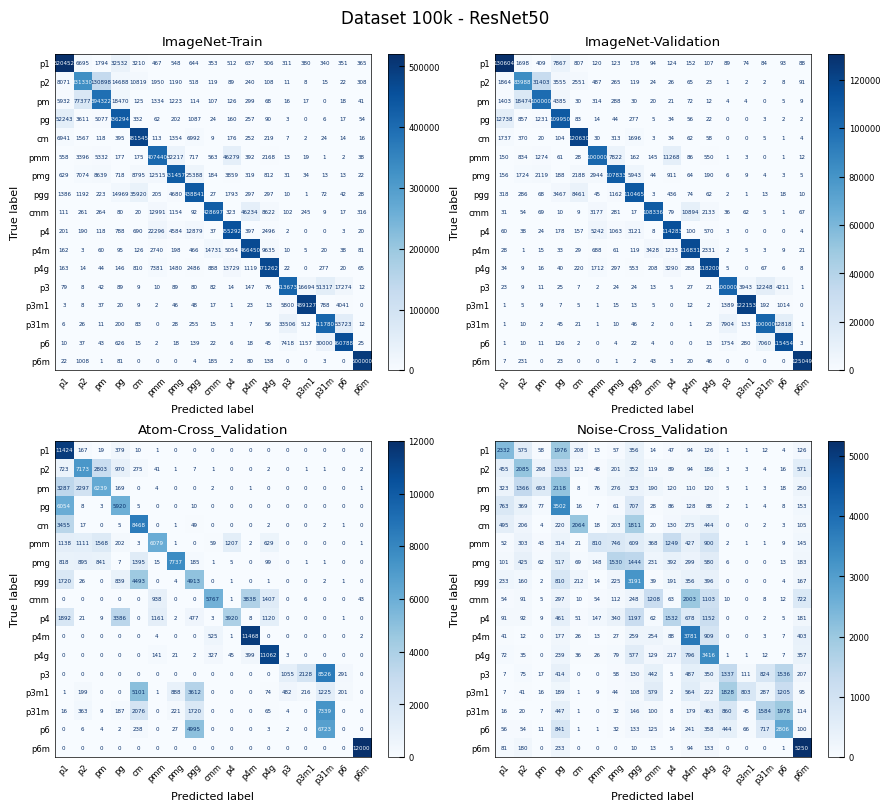

Confusion Matrix for 09022024-resnet50-dataset_v5_size-500k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


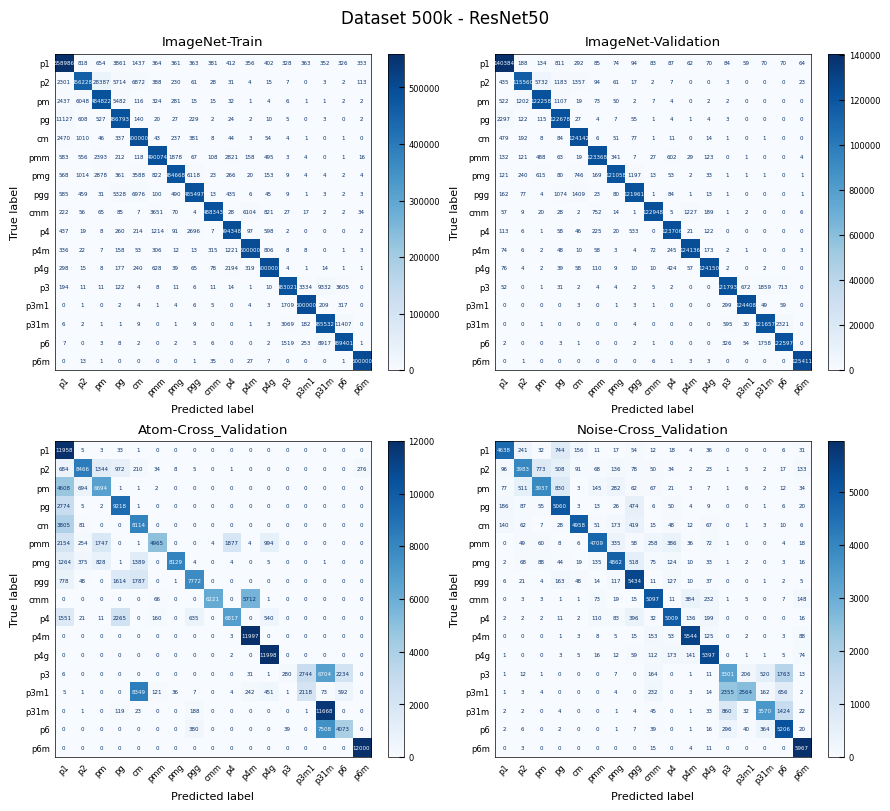

Confusion Matrix for 09022024-resnet50-dataset_v5_size-1m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


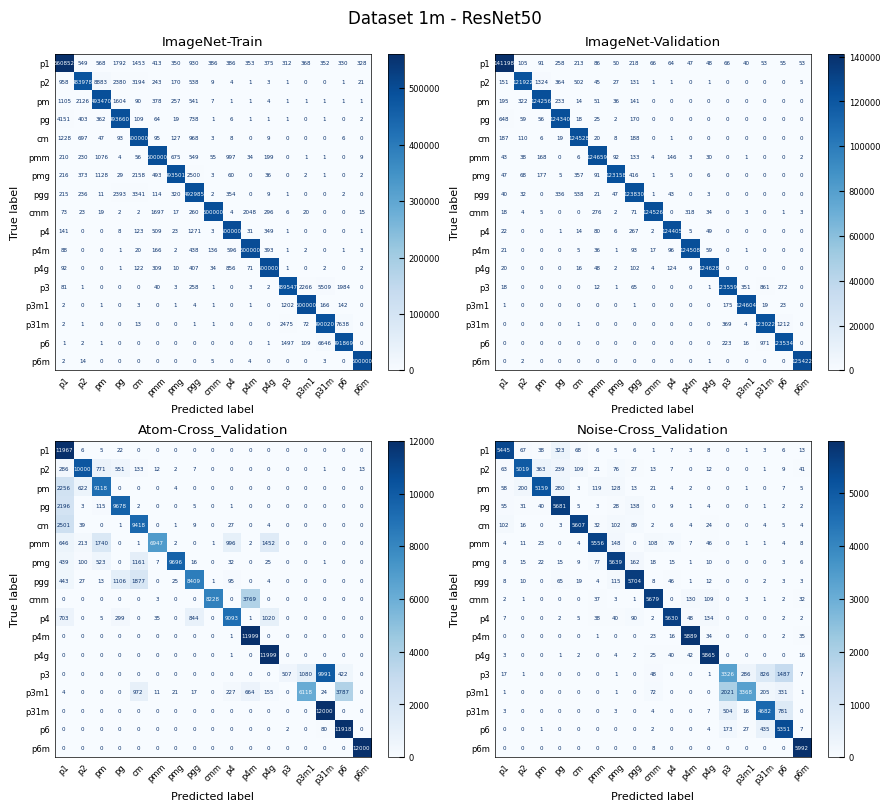

Confusion Matrix for 09052024-resnet50-dataset_v5_size-2m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


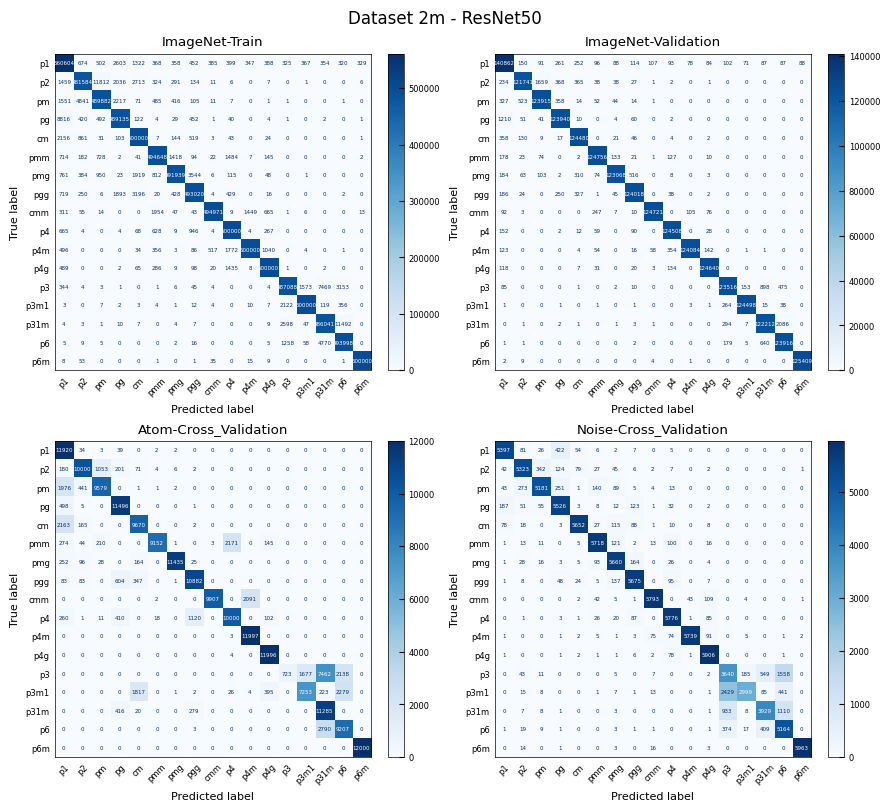

Confusion Matrix for 09032024-resnet50-dataset_v5_size-5m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


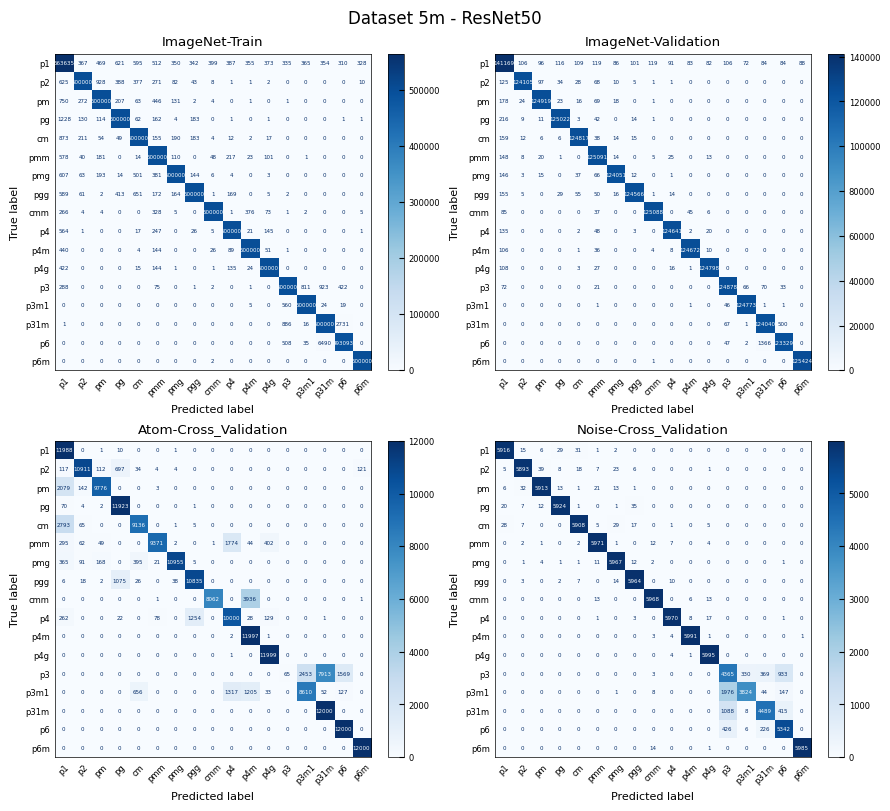

Confusion Matrix for 09112024-resnet50-dataset_v5_size-10m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


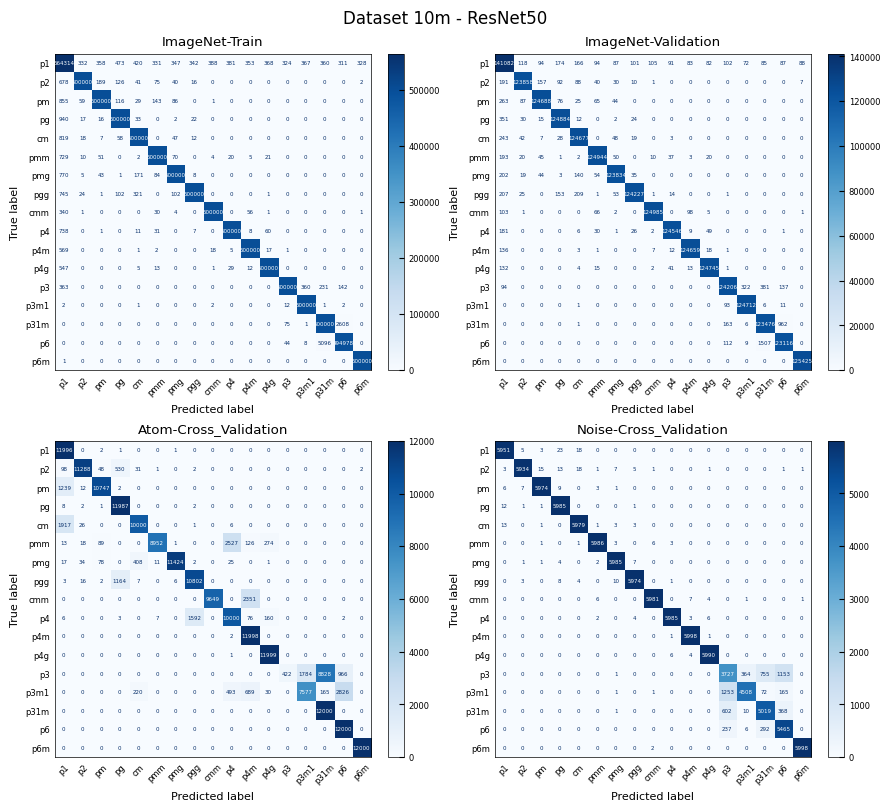

In [22]:
task_orders = ['1k', '10k', '100k', '500k', '1m', '2m', '5m', '10m']
dir_path_list = sort_tasks_by_size(glob.glob('../../models/ResNet50/*'), task_orders)

for dir_path, ds_num in zip(dir_path_list, task_orders):
    
    task = os.path.basename(dir_path)
    print(f'Confusion Matrix for {task}:')
    
    cm_list, subtitles = [], []    
    cm = np.load(f'../../results/ResNet50/{task}-imagenet_train_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'ImageNet-Train')

    cm = np.load(f'../../results/ResNet50/{task}-imagenet_valid_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'ImageNet-Validation')
    
    cm = np.load(f'../../results/ResNet50/{task}-atom_cross_validation_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'Atom-Cross_Validation')

    cm = np.load(f'../../results/ResNet50/{task}-noise_cross_validation_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'Noise-Cross_Validation')

    fig, axes = layout_fig(len(cm_list), 2, figsize=(10, 8))
    show_cm(cm_list, subtitles, fig=fig, axes=axes, suptitle=f'Dataset {ds_num} - ResNet50', classes=symmetry_classes, font_size=4)
    
    plt.savefig(f"../../figures/Dataset {ds_num}-ResNet50-ConfusionMatrix.png", dpi=600)
    plt.savefig(f"../../figures/Dataset {ds_num}-ResNet50-ConfusionMatrix.svg", dpi=600)
    plt.show()

Confusion Matrix for 09232024-FPN-dataset_v5_size-1k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


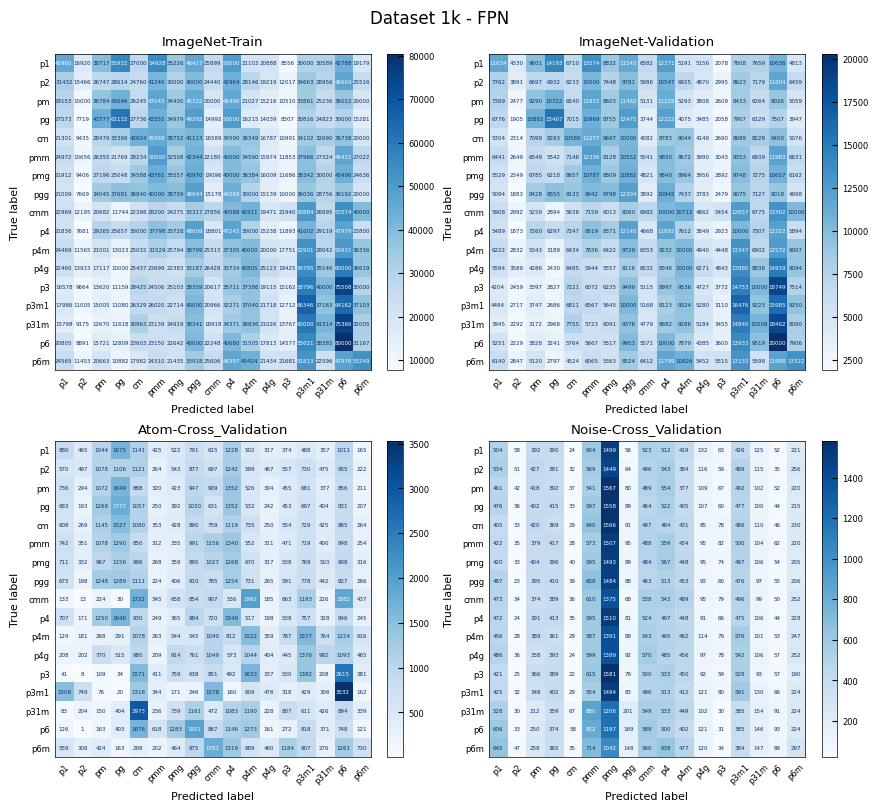

Confusion Matrix for 09232024-FPN-dataset_v5_size-10k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


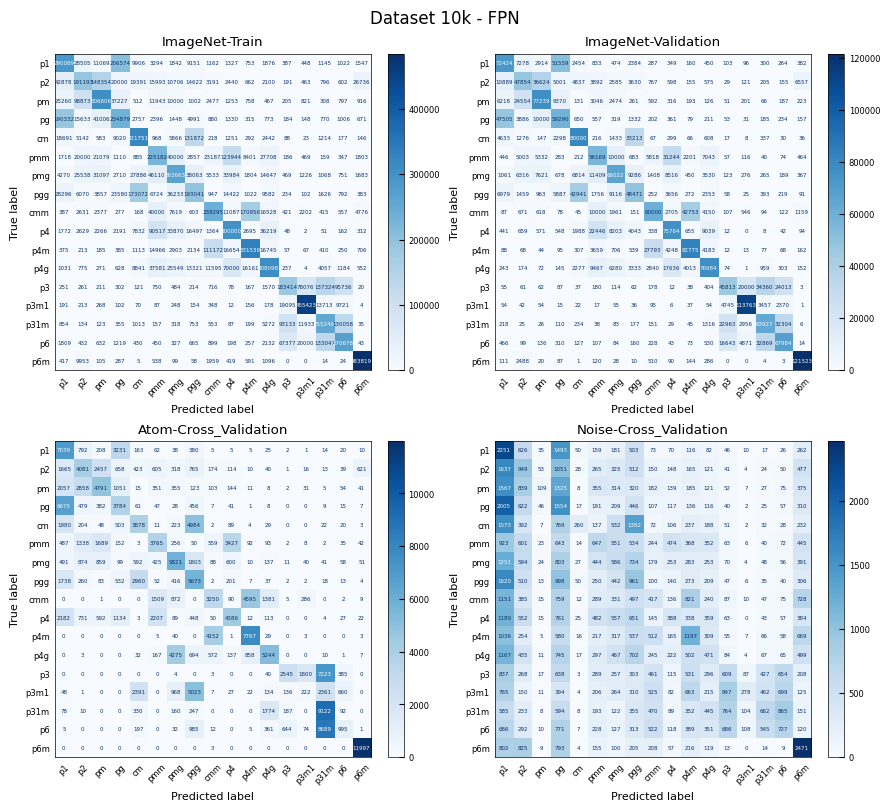

Confusion Matrix for 09242024-FPN-dataset_v5_size-100k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


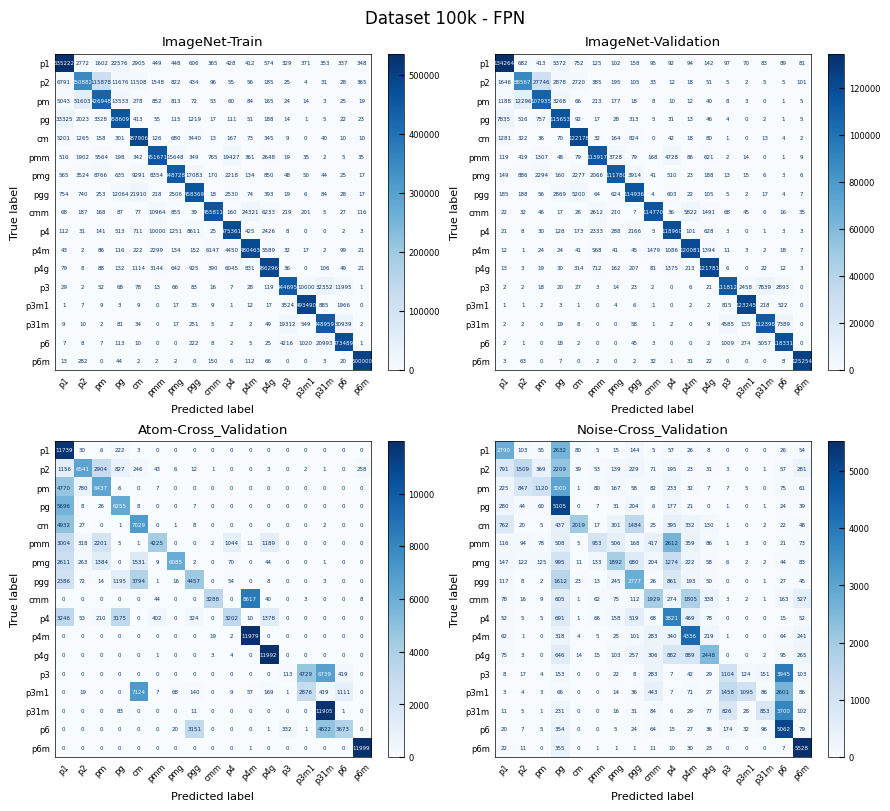

Confusion Matrix for 09252024-FPN-dataset_v5_size-500k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


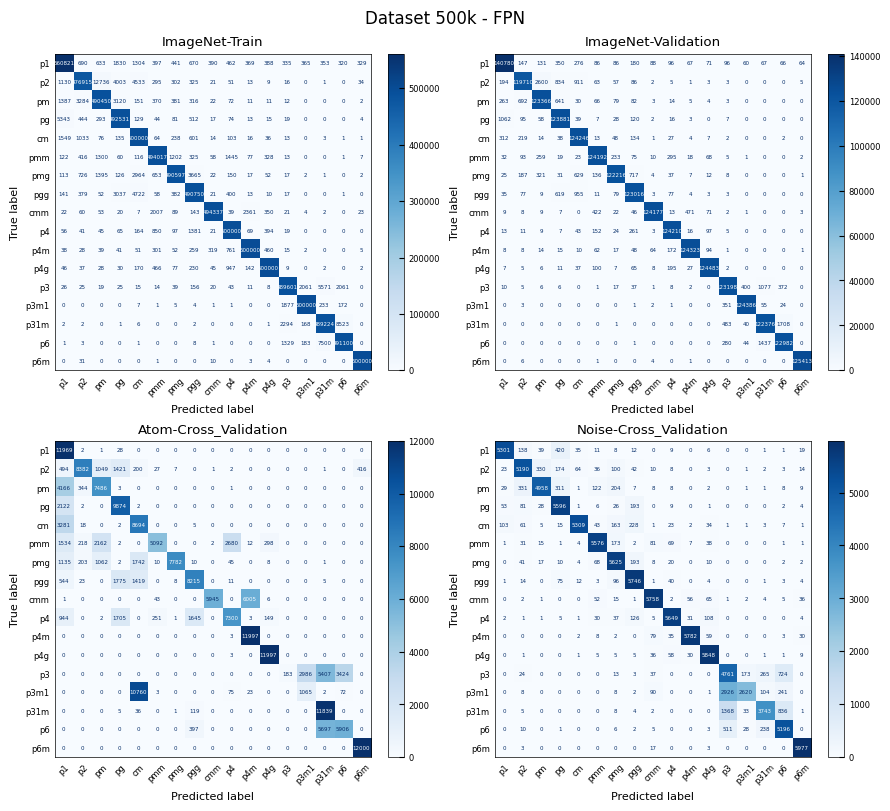

Confusion Matrix for 09262024-FPN-dataset_v5_size-2m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


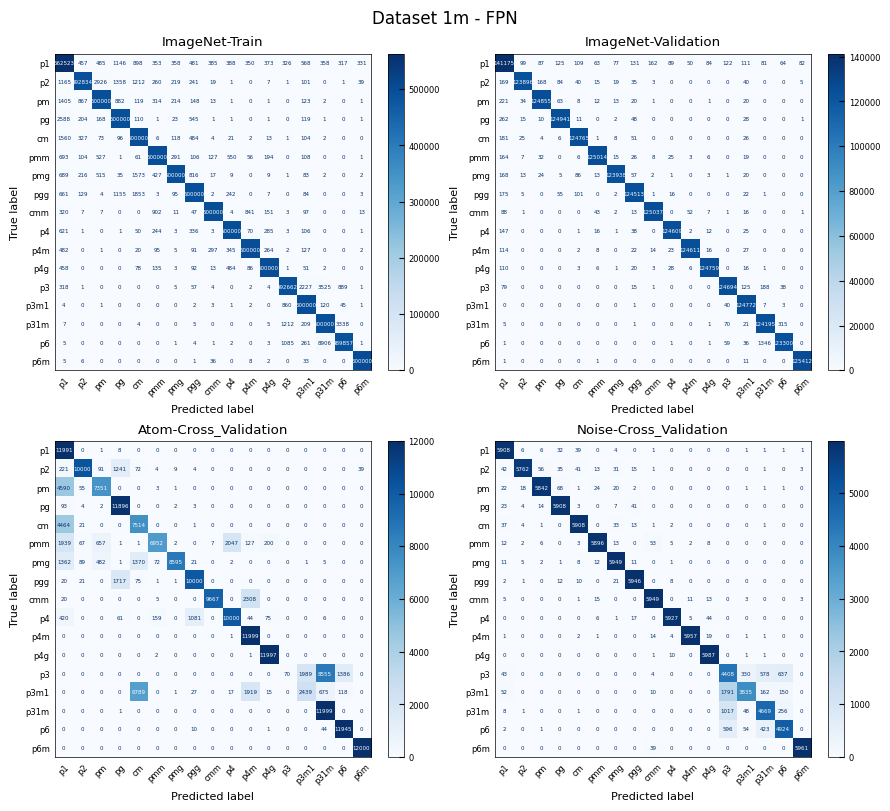

Confusion Matrix for 09252024-FPN-dataset_v5_size-1m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


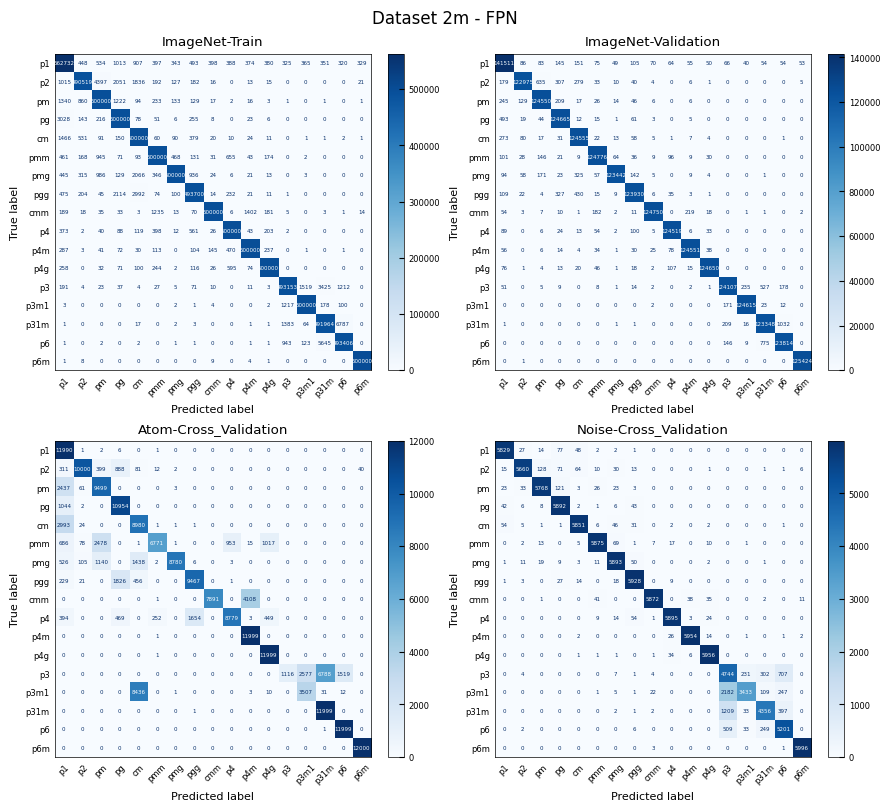

Confusion Matrix for 09272024-FPN-dataset_v5_size-5m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


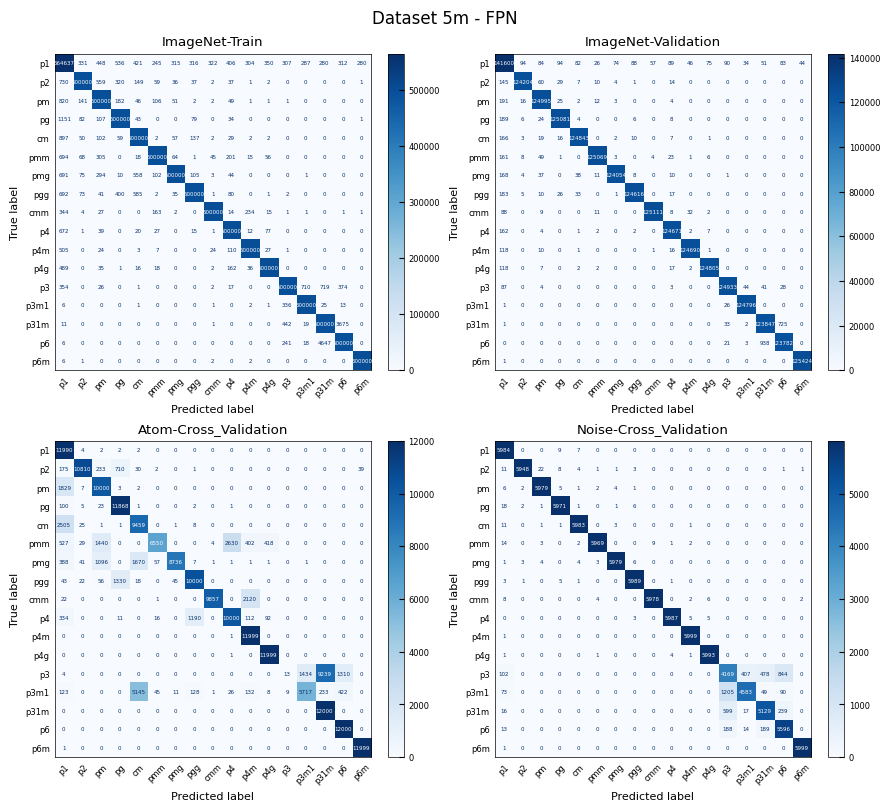

Confusion Matrix for 09282024-FPN-dataset_v5_size-10m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


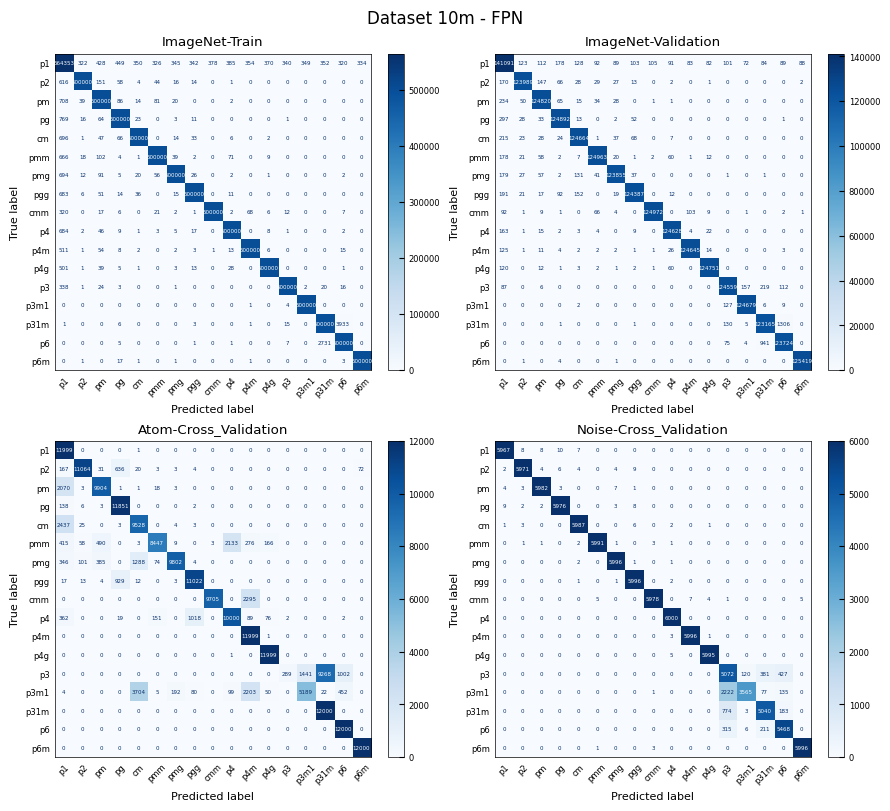

In [25]:
task_orders = ['1k', '10k', '100k', '500k', '1m', '2m', '5m', '10m']
dir_path_list = sort_tasks_by_size(glob.glob('../../models/FPN/*'), task_orders)

for dir_path, ds_num in zip(dir_path_list, task_orders):
    
    task = os.path.basename(dir_path)
    print(f'Confusion Matrix for {task}:')
    
    cm_list, subtitles = [], []    
    cm = np.load(f'../../results/FPN/{task}-imagenet_train_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'ImageNet-Train')

    cm = np.load(f'../../results/FPN/{task}-imagenet_valid_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'ImageNet-Validation')
    
    cm = np.load(f'../../results/FPN/{task}-atom_cross_validation_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'Atom-Cross_Validation')

    cm = np.load(f'../../results/FPN/{task}-noise_cross_validation_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'Noise-Cross_Validation')

    fig, axes = layout_fig(len(cm_list), 2, figsize=(10, 8))
    show_cm(cm_list, subtitles, fig=fig, axes=axes, suptitle=f'Dataset {ds_num} - FPN', classes=symmetry_classes, font_size=4)
    
    plt.savefig(f"../../figures/Dataset {ds_num}-FPN-ConfusionMatrix.png", dpi=600)
    plt.savefig(f"../../figures/Dataset {ds_num}-FPN-ConfusionMatrix.svg", dpi=600)
    plt.show()

Confusion Matrix for 09232024-XCiT-dataset_v5_size-1k:


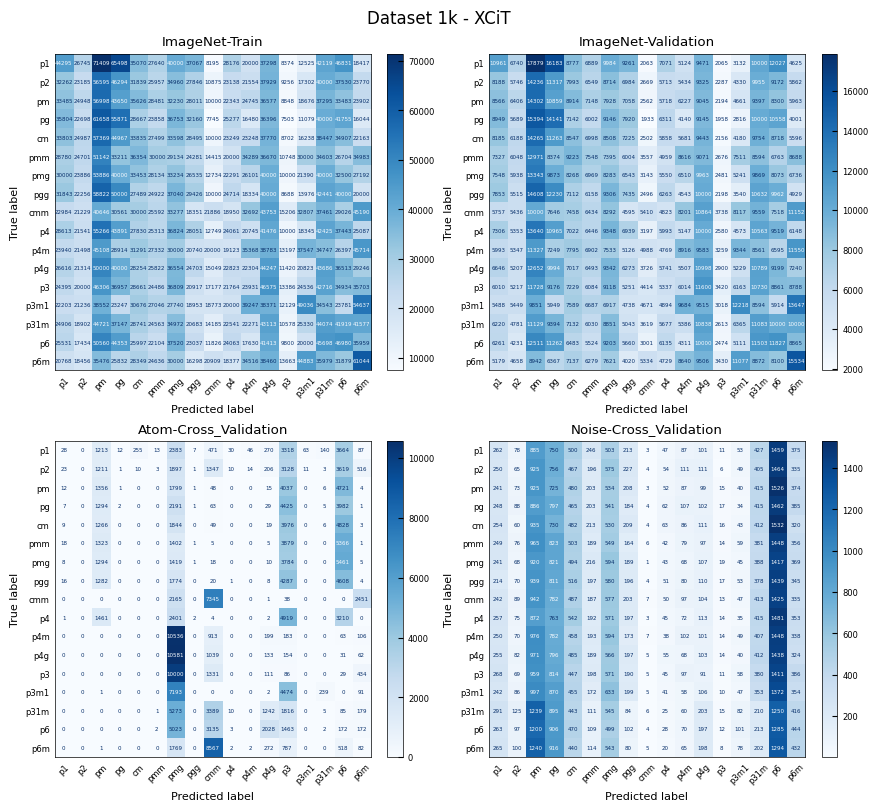

Confusion Matrix for 09232024-XCiT-dataset_v5_size-10k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


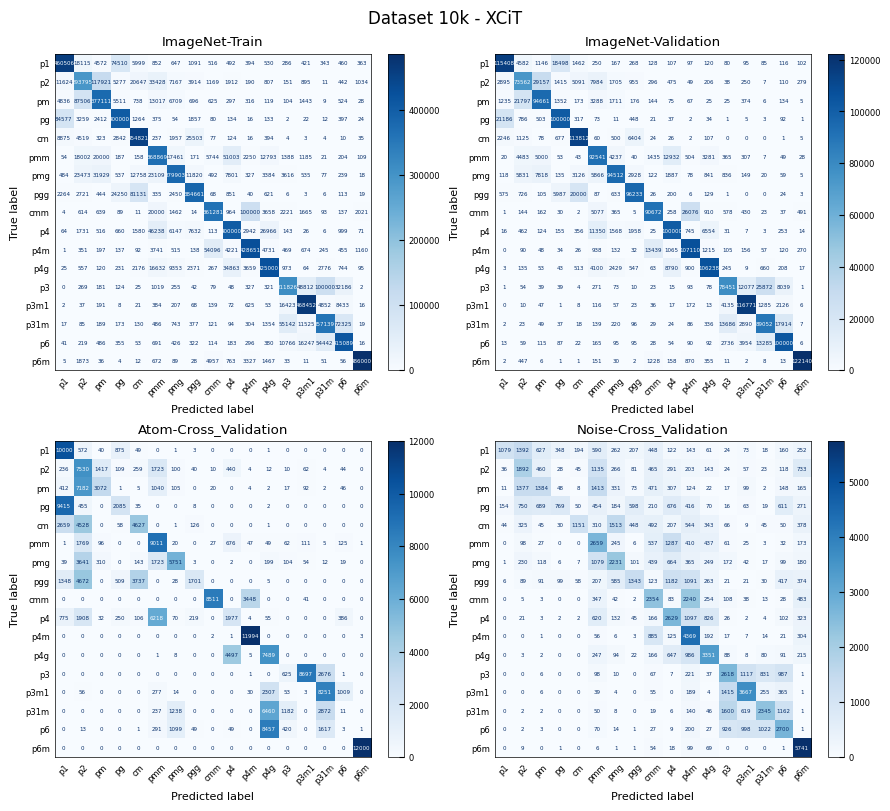

Confusion Matrix for 09302024-XCiT-dataset_v5_size-100k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


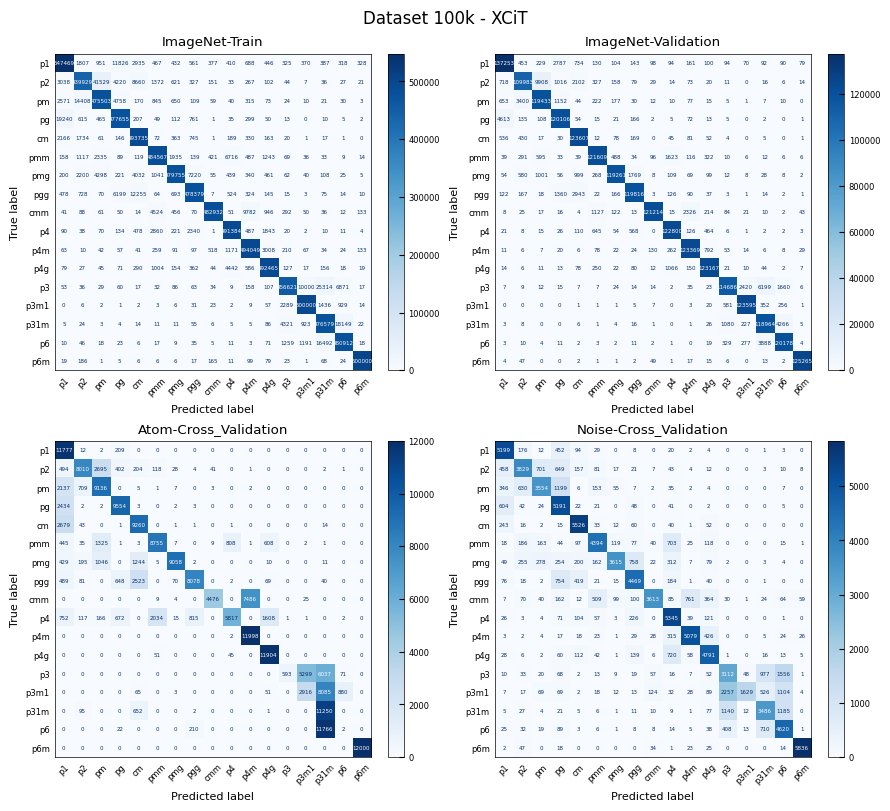

Confusion Matrix for 09302024-XCiT-dataset_v5_size-500k:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


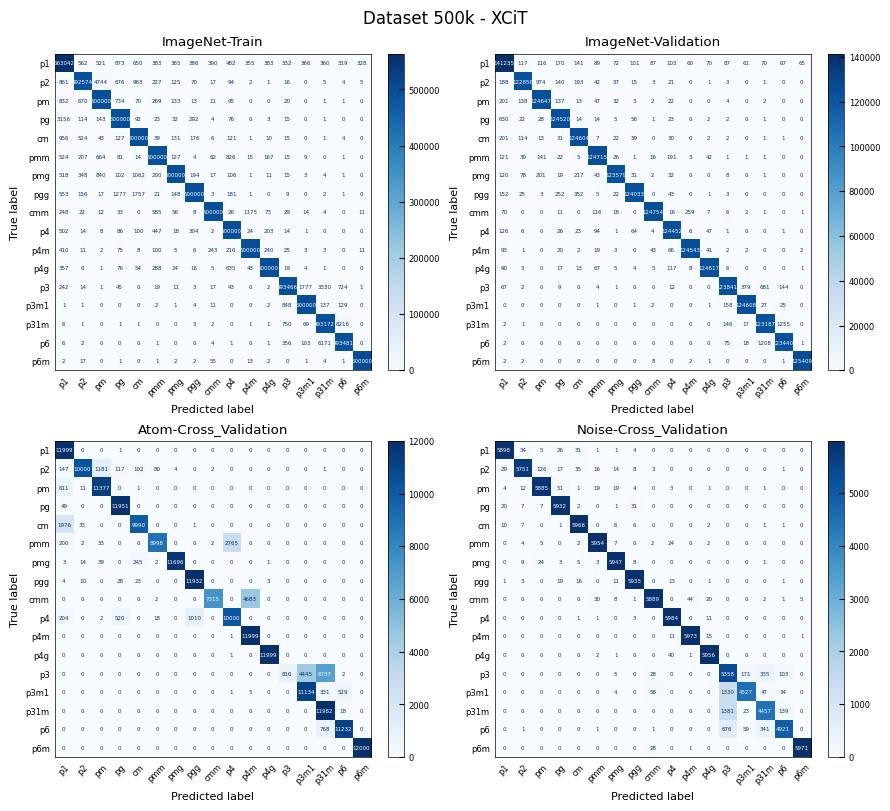

Confusion Matrix for 09302024-XCiT-dataset_v5_size-1m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


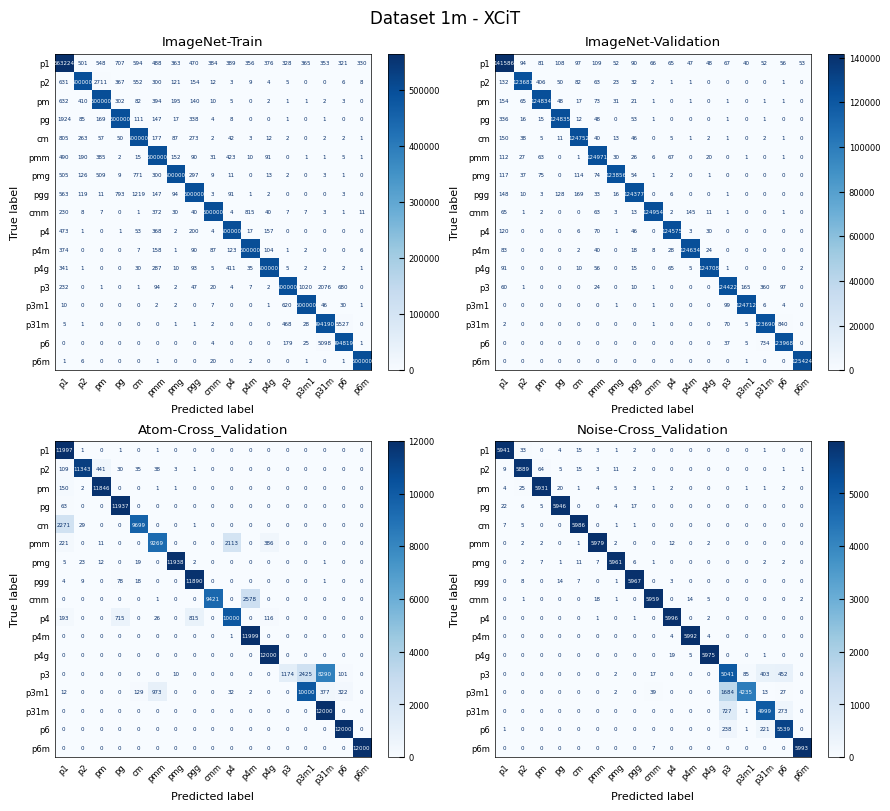

Confusion Matrix for 09302024-XCiT-dataset_v5_size-2m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


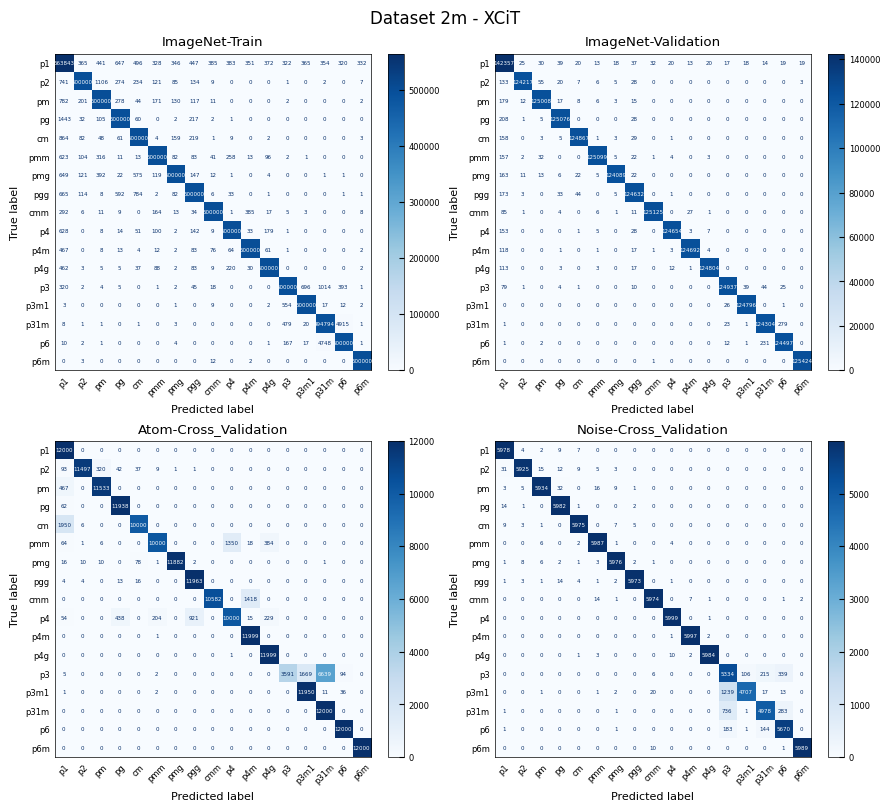

Confusion Matrix for 09302024-XCiT-dataset_v5_size-5m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


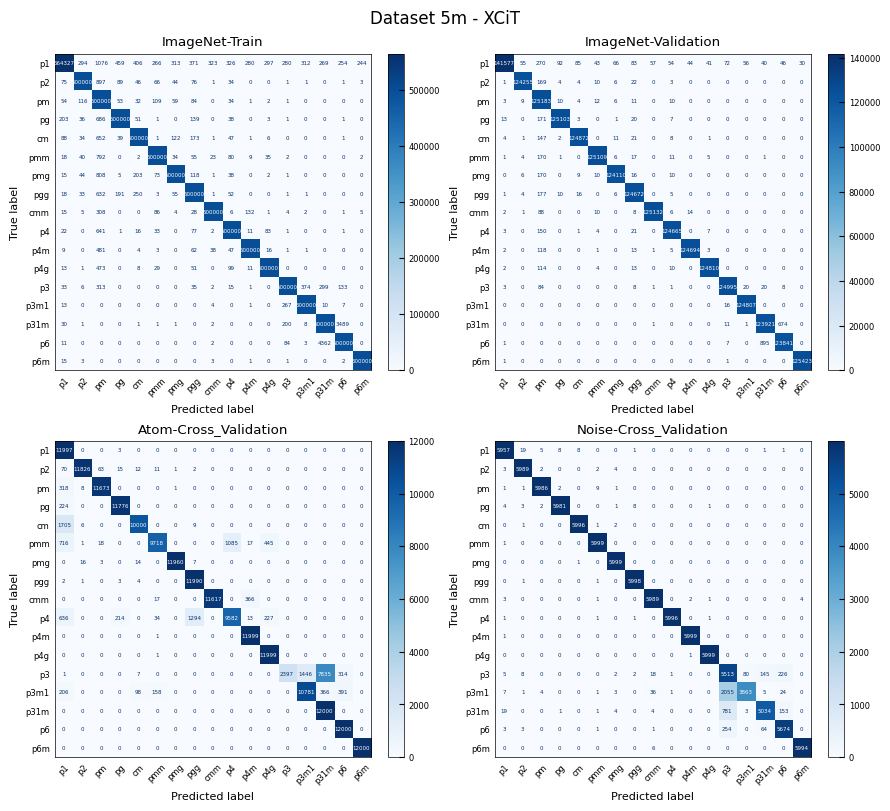

Confusion Matrix for 09302024-XCiT-dataset_v5_size-10m:


/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/src/m3learning-util/src/m3util/viz/layout.py:255: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(wspace=wspace, hspace=hspace)


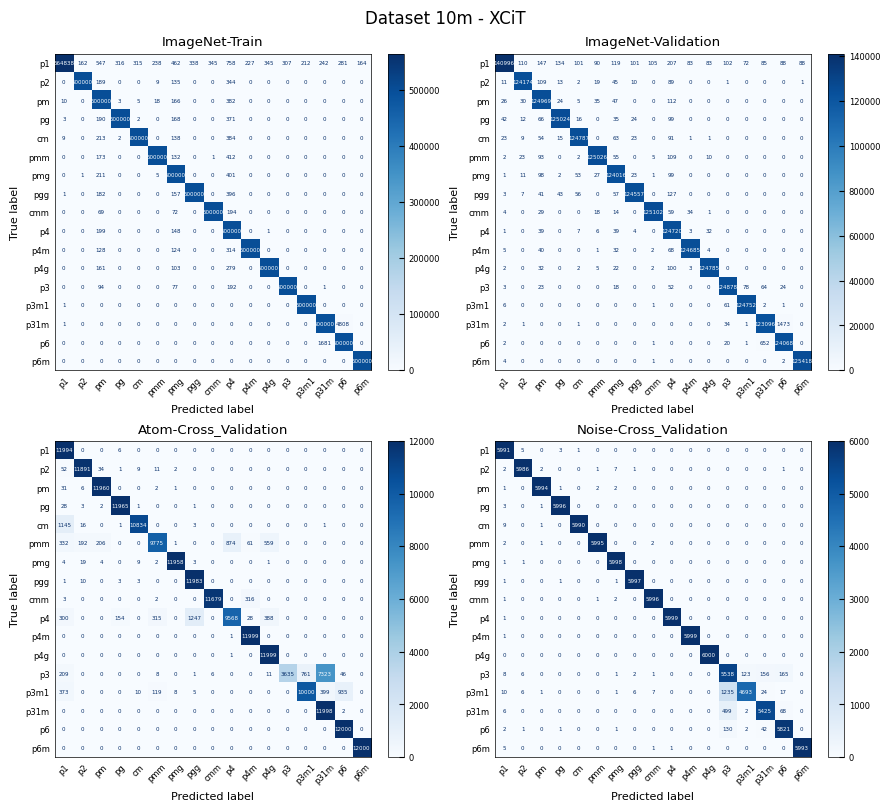

In [5]:
task_orders = ['1k', '10k', '100k', '500k', '1m', '2m', '5m', '10m']
dir_path_list = sort_tasks_by_size(glob.glob('../../models/XCiT/*'), task_orders)

for dir_path, ds_num in zip(dir_path_list, task_orders):
    
    task = os.path.basename(dir_path)
    print(f'Confusion Matrix for {task}:')
    
    cm_list, subtitles = [], []    
    cm = np.load(f'../../results/XCiT/{task}-imagenet_train_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'ImageNet-Train')

    cm = np.load(f'../../results/XCiT/{task}-imagenet_valid_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'ImageNet-Validation')
    
    cm = np.load(f'../../results/XCiT/{task}-atom_cross_validation_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'Atom-Cross_Validation')

    cm = np.load(f'../../results/XCiT/{task}-noise_cross_validation_cm.npy')
    cm_list.append(cm)
    subtitles.append(f'Noise-Cross_Validation')

    fig, axes = layout_fig(len(cm_list), 2, figsize=(10, 8))
    show_cm(cm_list, subtitles, fig=fig, axes=axes, suptitle=f'Dataset {ds_num} - XCiT', classes=symmetry_classes, font_size=4)
    
    plt.savefig(f"../../figures/Dataset {ds_num}-XCiT-ConfusionMatrix.png", dpi=600)
    plt.savefig(f"../../figures/Dataset {ds_num}-XCiT-ConfusionMatrix.svg", dpi=600)
    plt.show()

In [14]:
task = os.path.basename(dir_path_list[0])

In [7]:
file = find_last_epoch_file(glob.glob('../../models/ResNet50/09052024-resnet50-dataset_v5_size-1k/*'))
model = resnet50_(in_channels=3, n_classes=17)
model.load_state_dict(torch.load(file, weights_only=True))
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

100%|██████████| 133876/133876 [1:46:41<00:00, 20.91it/s]

Sum for true labels:


,p1,p2,pm,pg,cm,pmm,pmg,pgg,cmm,p4,p4m,p4g,p3,p3m1,p31m,p6,p6m
0,570097.0,500384.0,499589.0,499519.0,499744.0,499487.0,500502.0,499983.0,499538.0,499993.0,499874.0,499906.0,499695.0,499983.0,500223.0,500126.0,499384.0


Accuracy for these batches: 8.22572135925293%
printing set for seaborn


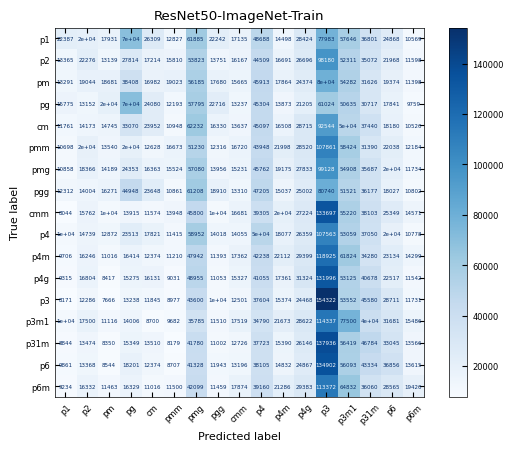

100%|██████████| 33469/33469 [27:16<00:00, 20.46it/s]


Sum for true labels:


,p1,p2,pm,pg,cm,pmm,pmg,pgg,cmm,p4,p4m,p4g,p3,p3m1,p31m,p6,p6m
0,142711.0,124474.0,125248.0,125318.0,125067.0,125325.0,124331.0,124891.0,125261.0,124851.0,124837.0,124953.0,125140.0,124823.0,124608.0,124744.0,125425.0


Accuracy for these batches: 8.232839584350586%
printing set for seaborn


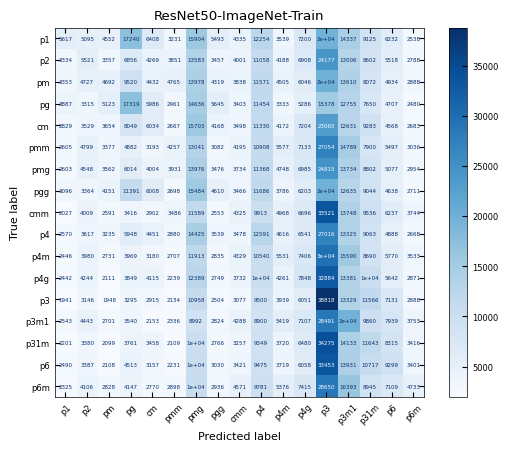

100%|██████████| 3188/3188 [02:32<00:00, 20.90it/s]


Sum for true labels:


,p1,p2,pm,pg,cm,pmm,pmg,pgg,cmm,p4,p4m,p4g,p3,p3m1,p31m,p6,p6m
0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0,12000.0


Accuracy for these batches: 8.268627166748047%
printing set for seaborn


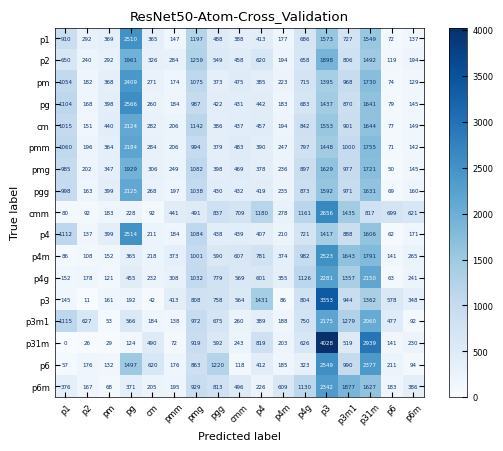

100%|██████████| 128/128 [01:12<00:00,  1.76it/s]

Sum for true labels:


,p1,p2,pm,pg,cm,pmm,pmg,pgg,cmm,p4,p4m,p4g,p3,p3m1,p31m,p6,p6m
0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0


Accuracy for these batches: 6.238234996795654%
printing set for seaborn


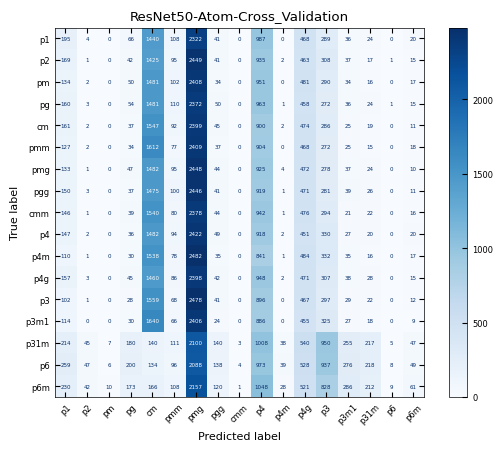

In [16]:
device = torch.device('cuda:7')

cm = confusion_matrix(model, train_dl, symmetry_classes, device, n_batches='all')
np.save(f'../../results/ResNet50/{task}-imagenet_train_cm.npy', cm)
plot_cm(cm, symmetry_classes, title='ResNet50-ImageNet-Train', cm_style='simple', fig_style='printing', font_size=4)

cm = confusion_matrix(model, valid_dl, symmetry_classes, device, n_batches='all')
np.save(f'../../results/ResNet50/{task}-imagenet_train_cm.npy', cm)
plot_cm(cm, symmetry_classes, title='ResNet50-ImageNet-Train', cm_style='simple', fig_style='printing', font_size=4)

cm = confusion_matrix(model, atom_dl, symmetry_classes, device, n_batches='all')
np.save(f'../../results/ResNet50/{task}-atom_cross_validation_cm.npy', cm)
plot_cm(cm, symmetry_classes, title='ResNet50-Atom-Cross_Validation', cm_style='simple', fig_style='printing', font_size=4)

cm = confusion_matrix(model, noise_dl, symmetry_classes, device, n_batches='all')
np.save(f'../../results/ResNet50/{task}-noise_cross_validation_cm.npy', cm)
plot_cm(cm, symmetry_classes, title='ResNet50-Atom-Cross_Validation', cm_style='simple', fig_style='printing', font_size=4)


In [4]:
model = torch.load('../../../saved_models/05312023-benchmark-resnet50_from_scratch-v4_10m-epoch-20.pt')
device = torch.device('cuda:1')

In [6]:
cm = confusion_matrix(model, cv_atom_noised_dl, symmetry_classes, device, n_batches='all')
np.save(f'../../../saved_results/Benchmark/ResNet50/{NAME}-cv_atom_noised_cm.npy', cm)

100%|██████████| 469/469 [04:52<00:00,  1.60it/s]

Sum for true labels:


,p1,p2,pm,pg,cm,pmm,pmg,pgg,cmm,p4,p4m,p4g,p3,p3m1,p31m,p6,p6m
0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0,28320.0


Accuracy for these batches: 52.82652043868394%


printing set for seaborn


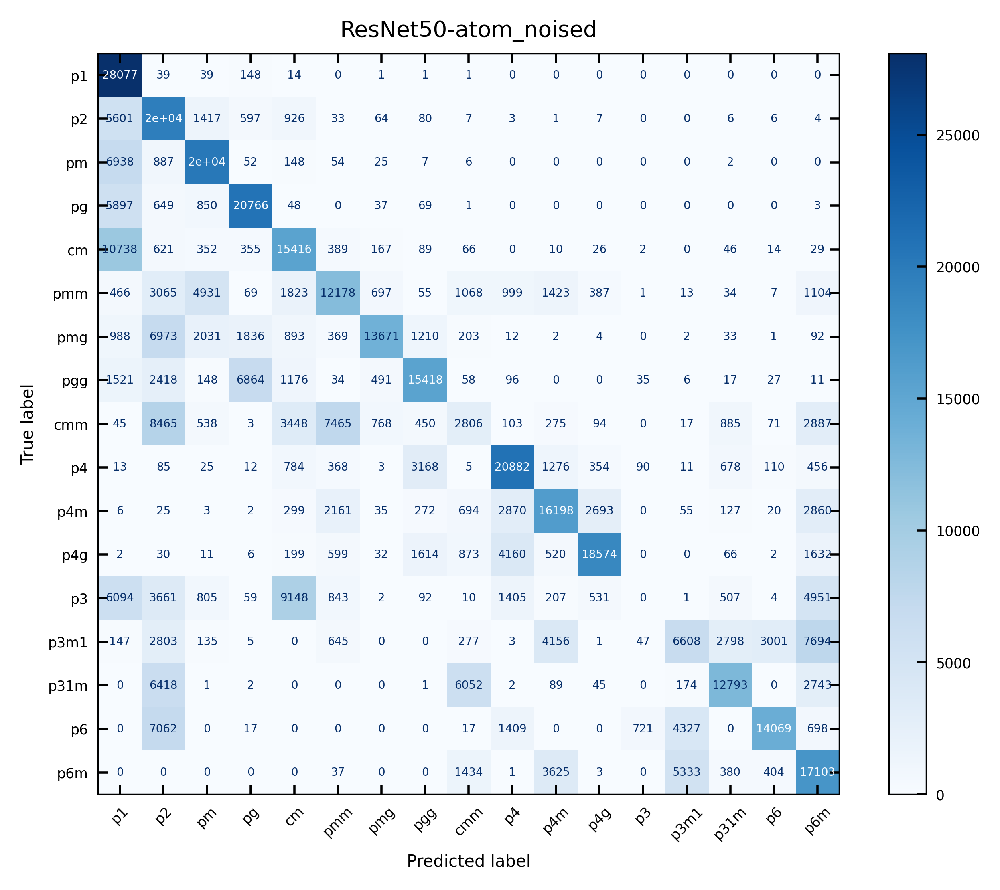

In [7]:
plot_cm(cm, symmetry_classes, title='ResNet50-atom_noised', cm_style='simple', fig_style='printing', font_size=4)

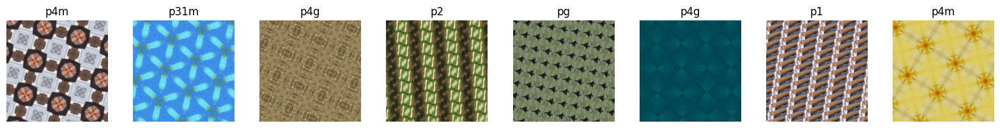

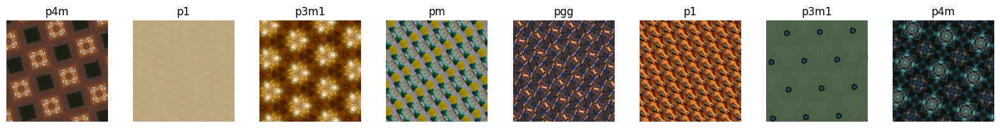

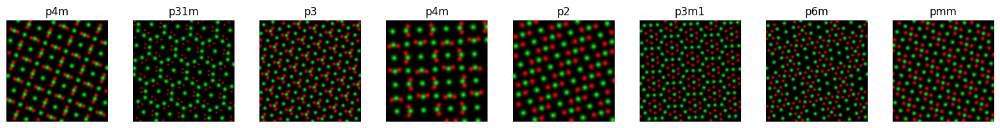

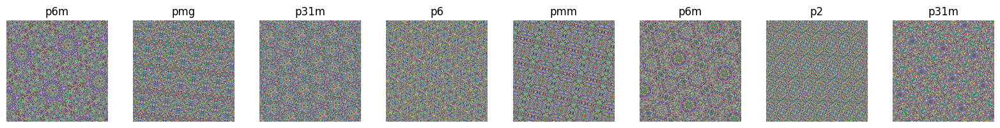

In [2]:
symmetry_classes = ['p1', 'p2', 'pm', 'pg', 'cm', 'pmm', 'pmg', 'pgg', 'cmm', 'p4', 'p4m', 'p4g', 'p3', 'p3m1', 'p31m', 'p6', 'p6m']
label_converter = list_to_dict(symmetry_classes)

# imagenet
train_ds = hdf5_dataset('../../../datasets/imagenet_v4_rot_10m_train_unchunked.h5', folder='train', transform=transforms.ToTensor())
train_dl = DataLoader(train_ds, batch_size=1028, shuffle=False, num_workers=2)
viz_dataloader(train_dl, label_converter=label_converter)

valid_ds = hdf5_dataset('../../../datasets/imagenet_v4_rot_2m_valid_unchunked.h5', folder='valid', transform=transforms.ToTensor())
valid_dl = DataLoader(valid_ds, batch_size=1028, shuffle=False, num_workers=2)
viz_dataloader(valid_dl, label_converter=label_converter)

cv_atom_ds = hdf5_dataset('../../../datasets/atom_v4_rot_2m_unchunked.h5', folder='test', transform=transforms.ToTensor())
cv_atom_dl = DataLoader(cv_atom_ds, batch_size=1028, shuffle=False, num_workers=2)
viz_dataloader(cv_atom_dl, label_converter=label_converter)

cv_noise_ds = hdf5_dataset('../../../datasets/noise_v4_rot_2m-test.h5', folder='test', transform=transforms.ToTensor())
cv_noise_dl = DataLoader(cv_noise_ds, batch_size=1028, shuffle=False, num_workers=2)
viz_dataloader(cv_noise_dl, label_converter=label_converter)

In [3]:
model = fpn_resnet50_classification(in_channels=3, n_classes=17)

model = torch.load('../../../saved_models/05312023-benchmark-resnet50_from_scratch-v4_10m-epoch-20.pt')
device = torch.device('cuda:1')

### generate confusion matrix

In [4]:
cm = confusion_matrix(model, train_dl, symmetry_classes, device, n_batches='all')
np.save(f'../../../saved_results/Benchmark/ResNet50/{NAME}-train_imagenet_cm.npy', cm)

cm = confusion_matrix(model, valid_dl, symmetry_classes, device, n_batches='all')
np.save(f'../../../saved_results/Benchmark/ResNet50/{NAME}-valid_imagenet_cm.npy', cm)

cm = confusion_matrix(model, cv_atom_dl, symmetry_classes, device, n_batches='all')
np.save(f'../../../saved_results/Benchmark/ResNet50/{NAME}-cv_atom_cm.npy', cm)

cm = confusion_matrix(model, cv_noise_dl, symmetry_classes, device, n_batches='all')
np.save(f'../../../saved_results/Benchmark/ResNet50/{NAME}-cv_noise_cm.npy', cm)

  0%|          | 0/9728 [00:00<?, ?it/s]

  0%|          | 20/9728 [00:16<1:39:34,  1.62it/s]

### visualize confusions 

In [5]:
files = glob.glob(f'../../../saved_results/Benchmark/ResNet50/*')
files

['../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-train_imagenet_cm.npy',
 '../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-cv_noise_cm.npy',
 '../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-cv_atom_cm.npy',
 '../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-valid_imagenet_cm.npy',
 '../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-cv_atom_noised_cm.npy']

In [8]:
for file in files:
    print(file)
    cm = np.load(file)
    accuracy = np.trace(cm) / np.sum(cm)
    print(f"Accuracy: {accuracy * 100:.2f}%\n")

    # plot_cm(cm, symmetry_classes, title=file.split('/')[-1].split('.')[0], cm_style='simple', fig_style='printing', font_size=4)

../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-train_imagenet_cm.npy
Accuracy: 99.96%

../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-cv_noise_cm.npy
Accuracy: 94.86%

../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-cv_atom_cm.npy
Accuracy: 57.93%

../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-valid_imagenet_cm.npy
Accuracy: 99.91%

../../../saved_results/Benchmark/ResNet50/01102024-benchmark-resnet50_from_scratch-v4_10m-cv_atom_noised_cm.npy
Accuracy: 52.83%



printing set for seaborn


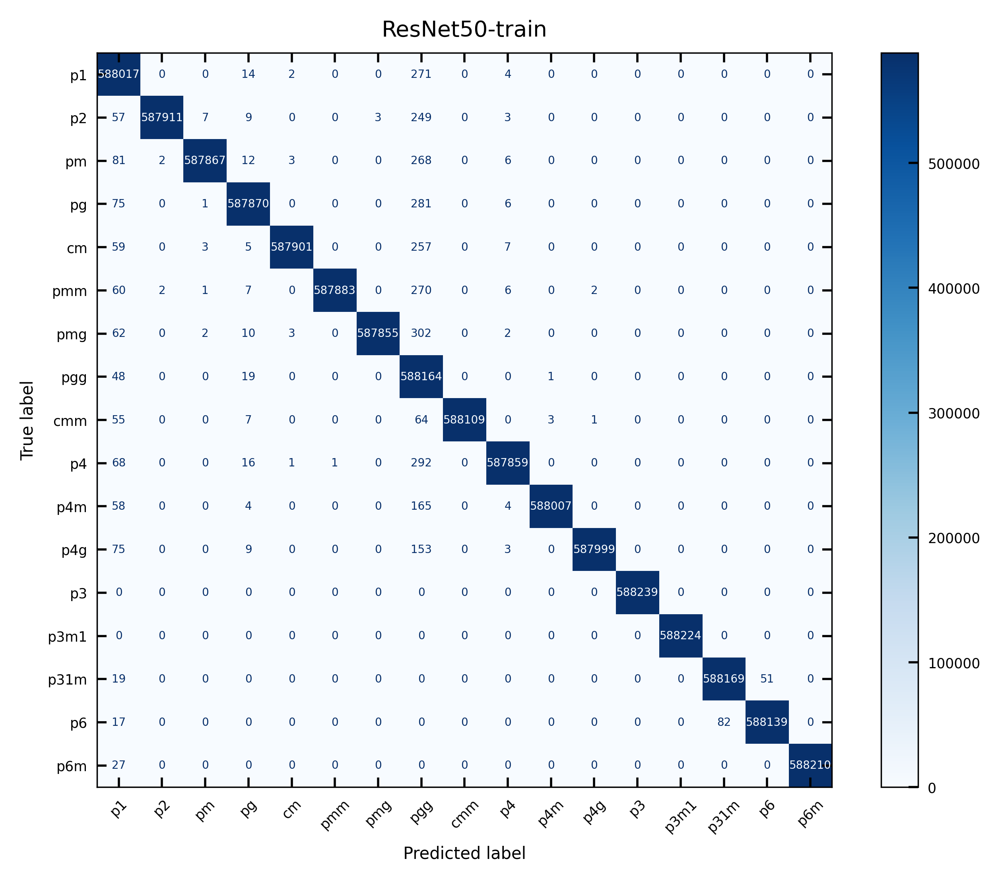

printing set for seaborn


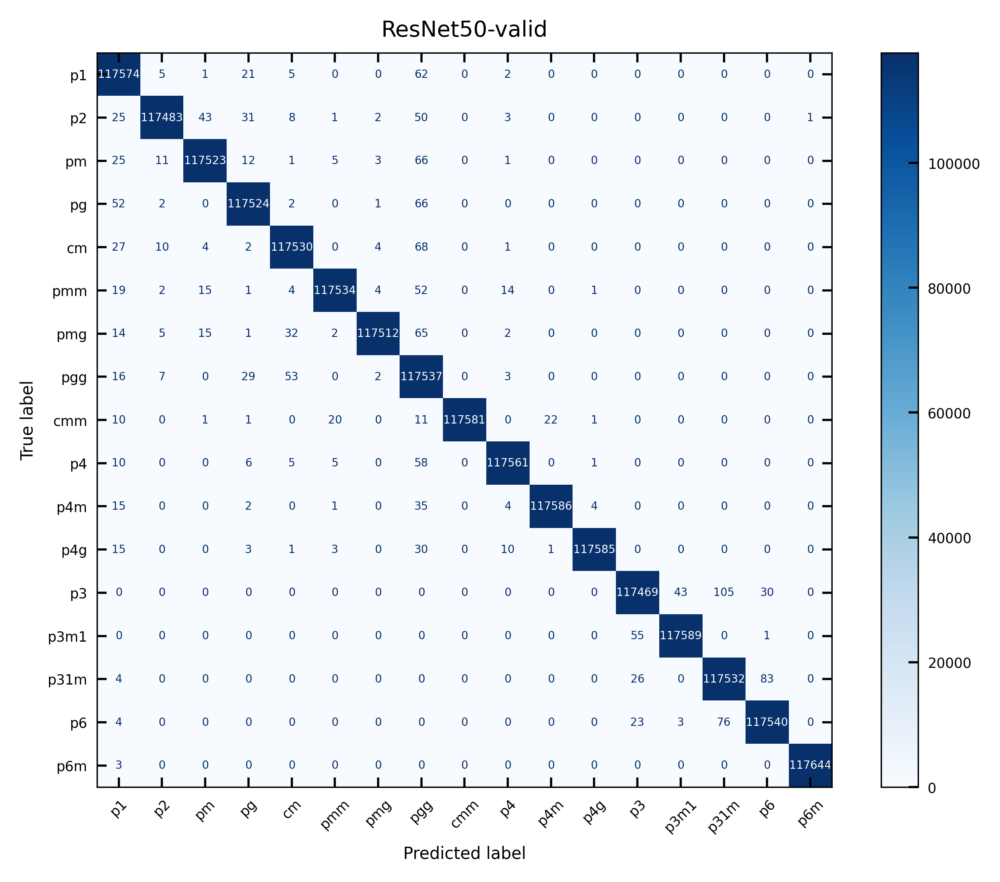

printing set for seaborn


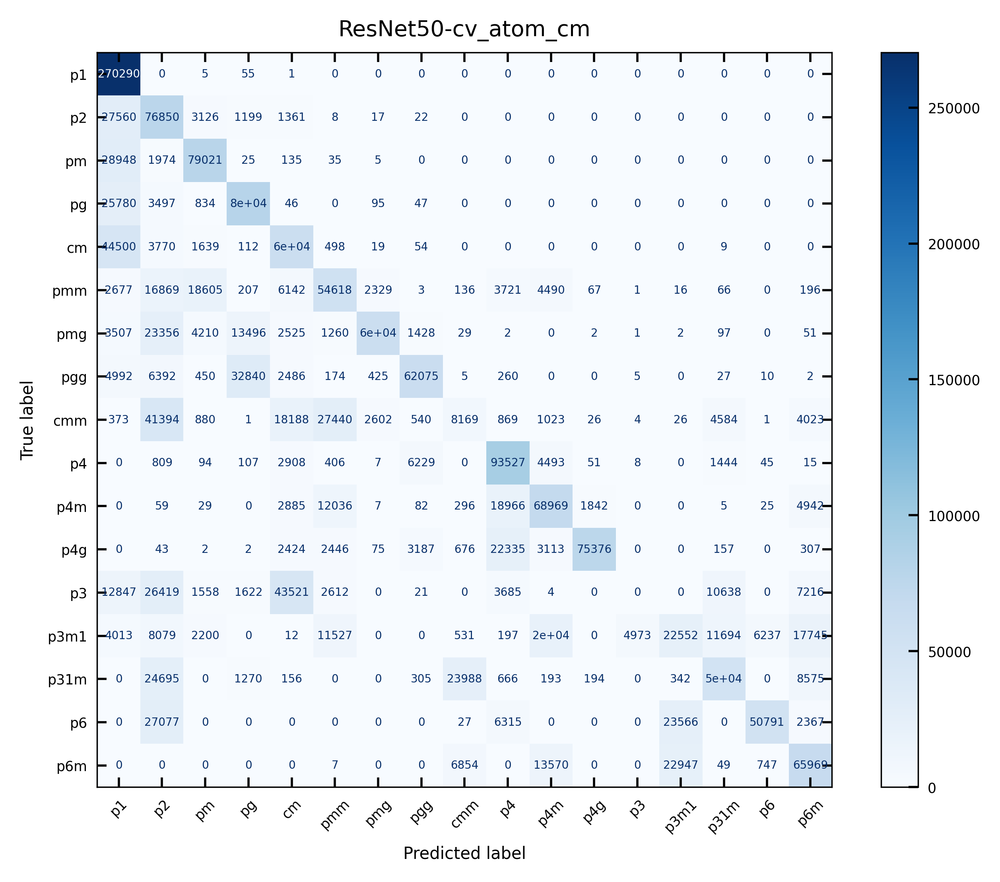

printing set for seaborn


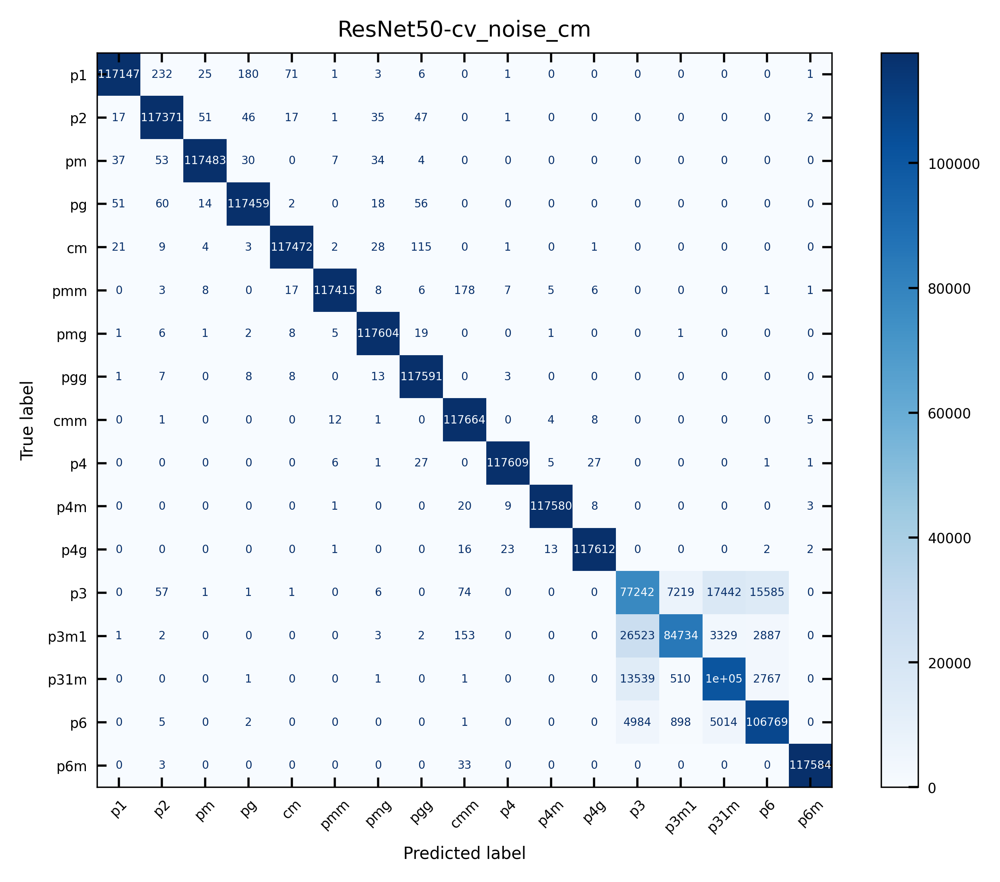

In [13]:
files = glob.glob(f'../../../saved_results/Benchmark/ResNet50/*')
keywords = ['train', 'valid', 'cv_atom_cm', 'cv_noise_cm']
show_cm(files, keywords, title_head='ResNet50-', file_path=f'../../../figures/Benchmark/ResNet50/', cm_style='simple', fig_style='printing', font_size=4)

### visualize confusions in compact layout

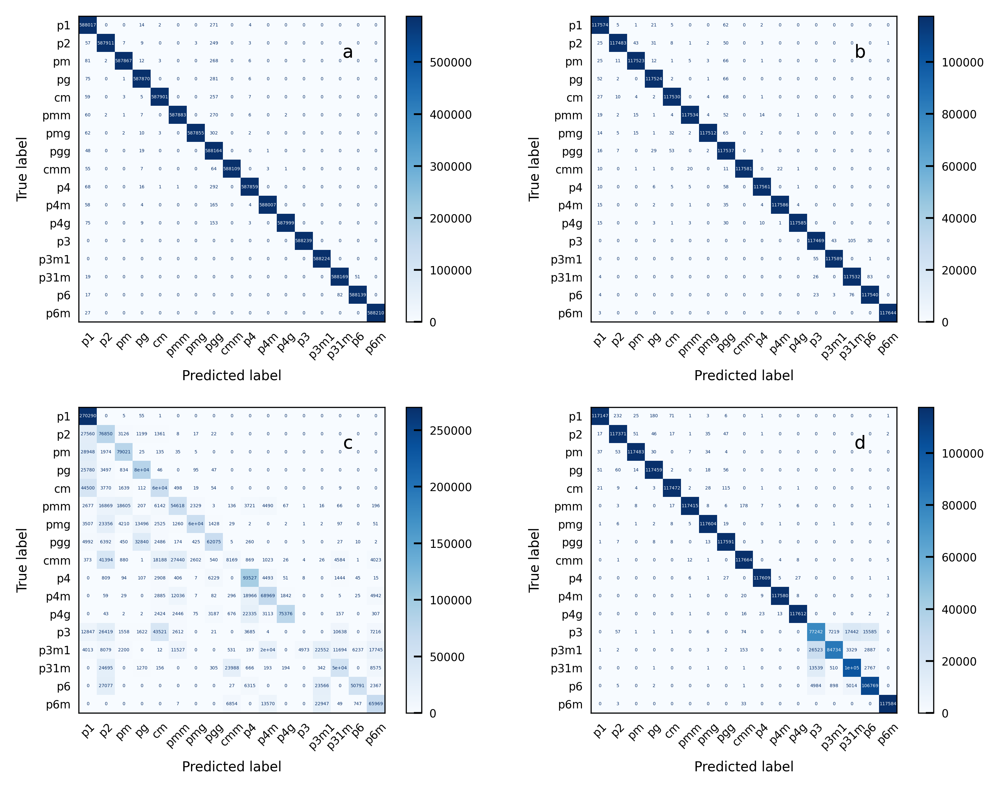

In [16]:
files = glob.glob(f'../../../saved_results/Benchmark/ResNet50/*')
keywords = ['train', 'valid', 'cv_atom_cm', 'cv_noise_cm']

show_cm(files, keywords, summary=True, title_head=None, cm_style='simple', fig_style='printing', font_size=2,
        file_path='../../../figures/Benchmark/ResNet50/Summary_cm-ResNet50')